# Gaussian Processes for Yield Prediction - Potato

As standard bayesian models, we will use Gaussian Processes to fit a function that calculates Yield crop

In [42]:
import numpy as np
import pandas as pd
import pymc3 as pm
import arviz as az
import geopandas as gpd
import matplotlib.pyplot as plt

import pickle

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, r2_score

%reload_ext autoreload
%autoreload 2

from utils import *
from gaussian_processes import GaussianProcess

az.style.use('arviz-whitegrid')

In [43]:
# Set random seed
np.random.seed(42)

## Load and build the dataset

For simplicity, we start with only 2 features, the most relevant according to the linear regression model

In [44]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
0,Albania,153105.043478,1485.0,99.788701,16.326957,41.0,20.0,708.0
1,Algeria,182413.956522,89.0,68.021070,17.488261,28.0,3.0,800.0
2,Angola,59085.739130,1010.0,0.642069,24.303043,-12.5,18.5,1112.0
3,Argentina,262059.173913,591.0,191.594290,17.708478,-34.0,-64.0,595.0
4,Armenia,151076.904762,562.0,17.051459,9.580952,40.0,45.0,1792.0
...,...,...,...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,154.273770,8.413333,49.0,32.0,175.0
91,United Kingdom,406131.695652,1220.0,250.231906,9.602783,54.0,-2.0,75.0
92,Uruguay,146737.043478,1300.0,333.648250,16.980870,-33.0,-56.0,109.0
93,Zambia,115800.652174,1020.0,28.707037,21.064783,-15.0,30.0,1138.0


Remove less relevant features according to the linear model

In [45]:
cy = cy.drop('lat', axis=1)
cy = cy.drop('lon', axis=1)
cy = cy.drop('elev', axis=1)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp
0,Albania,153105.043478,1485.0,99.788701,16.326957
1,Algeria,182413.956522,89.0,68.021070,17.488261
2,Angola,59085.739130,1010.0,0.642069,24.303043
3,Argentina,262059.173913,591.0,191.594290,17.708478
4,Armenia,151076.904762,562.0,17.051459,9.580952
...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,154.273770,8.413333
91,United Kingdom,406131.695652,1220.0,250.231906,9.602783
92,Uruguay,146737.043478,1300.0,333.648250,16.980870
93,Zambia,115800.652174,1020.0,28.707037,21.064783


Get geodata for plot world map

In [46]:
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp
count      95.000000             95.000000             95.000000  95.000000
mean   181841.413334           1019.326316            175.288879  17.850083
std     96668.731420            696.800613            243.238755   7.388661
min     20516.217391             51.000000              0.120619   3.459565
25%    127517.738095            577.000000             12.605934  10.646667
50%    160965.434783            788.000000             82.887988  18.163478
75%    224914.108696           1492.500000            240.374184  24.843652
max    448891.538462           3240.000000           1414.555032  29.718696


Standardize the data

In [28]:
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

n_samples, n_features = x_std_data.shape

In [203]:
results = {}

## First model

Let's start with the most used kernel, the **Exponential Quadratic**

$$
\phi(x,x') = \exp \left( -\frac{||x-x'||^2}{2\ell^2} \right)
$$

In [141]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [256]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8_000, tune=4_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 291 seconds.
The number of effective samples is smaller than 25% for some parameters.


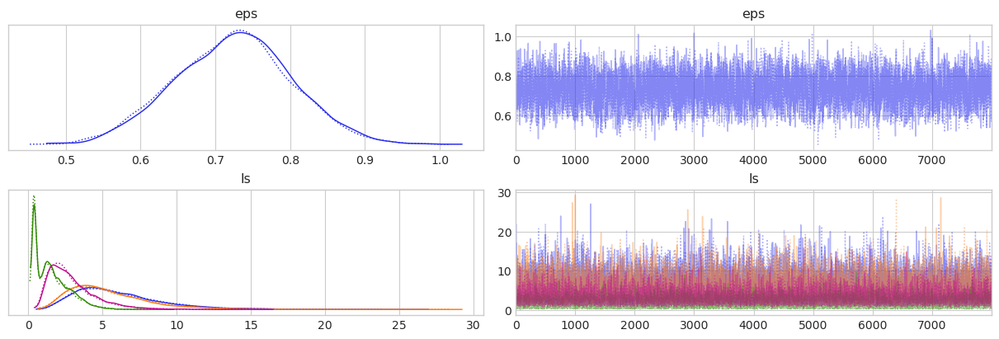

In [207]:
plot_trace(trace, ['eps', 'ls'])

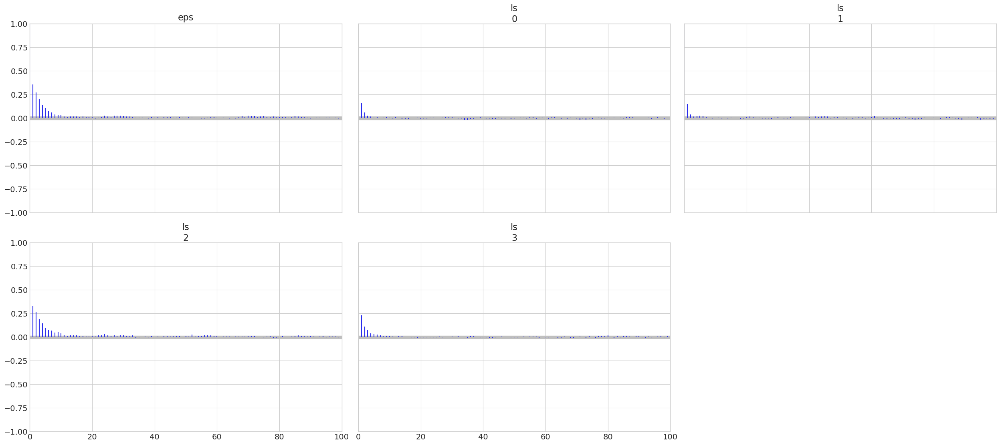

In [209]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [16]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

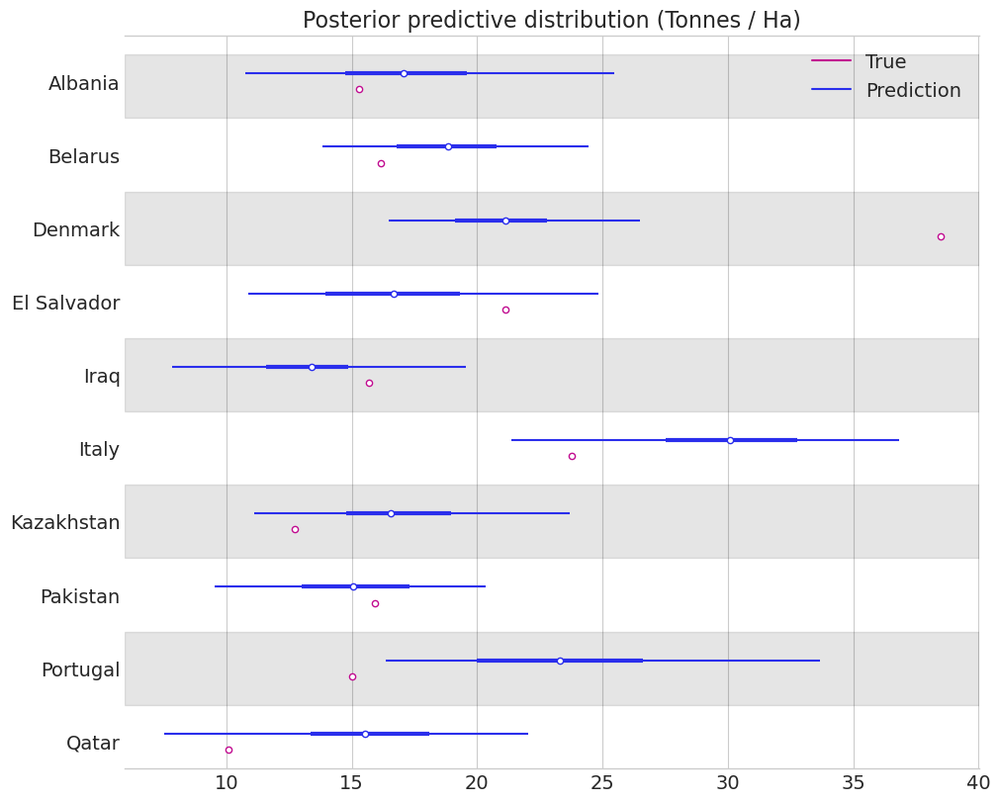

In [105]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

[]

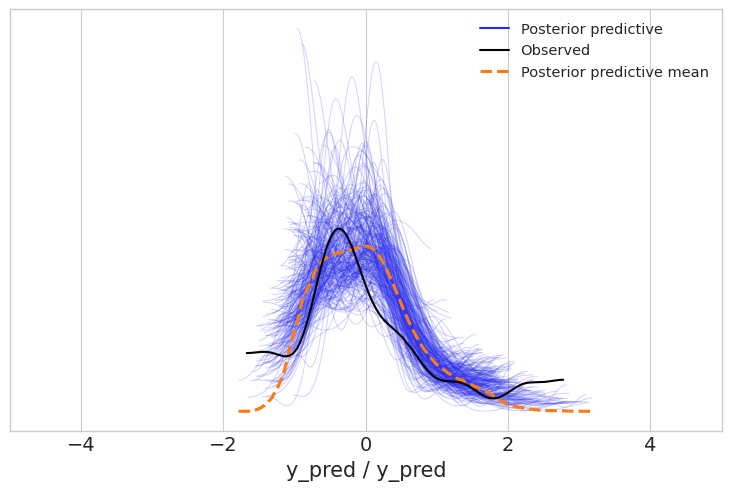

In [143]:
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=256)
ax.set_xlim((-5, 5))
plt.plot()

In [259]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.556758027645767
MAE: 51737.180388898705


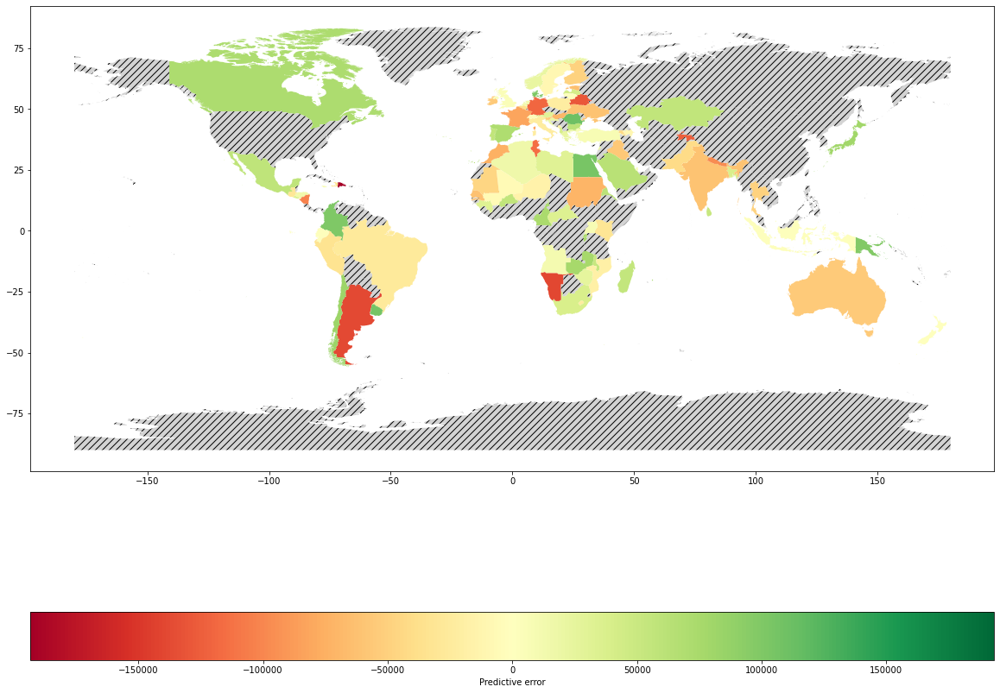

In [260]:
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data)

In [262]:
results['expquad1'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More samples
Let's get more samples in order to check if we would need more

In [14]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [ ]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 600 seconds.
The number of effective samples is smaller than 25% for some parameters.


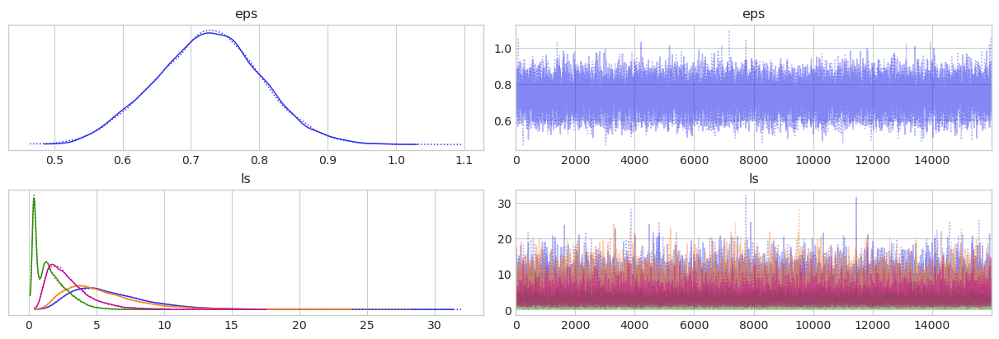

In [211]:
plot_trace(trace, ['eps', 'ls'])

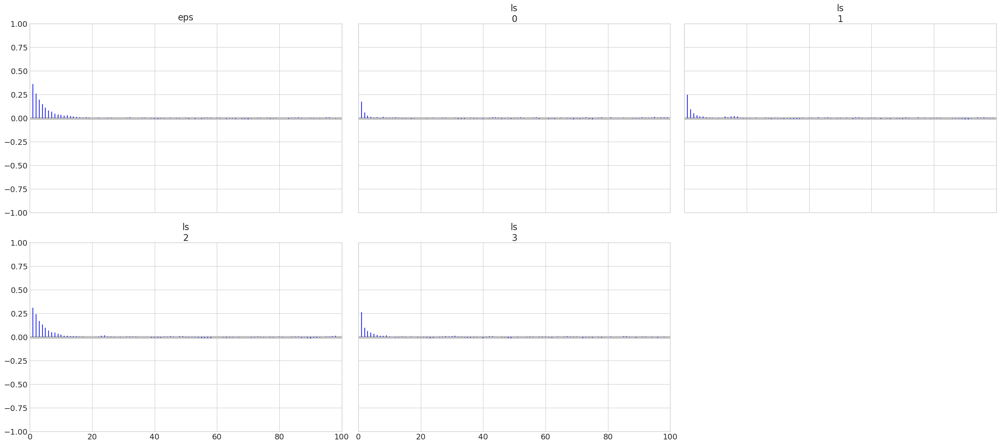

In [212]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [ ]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

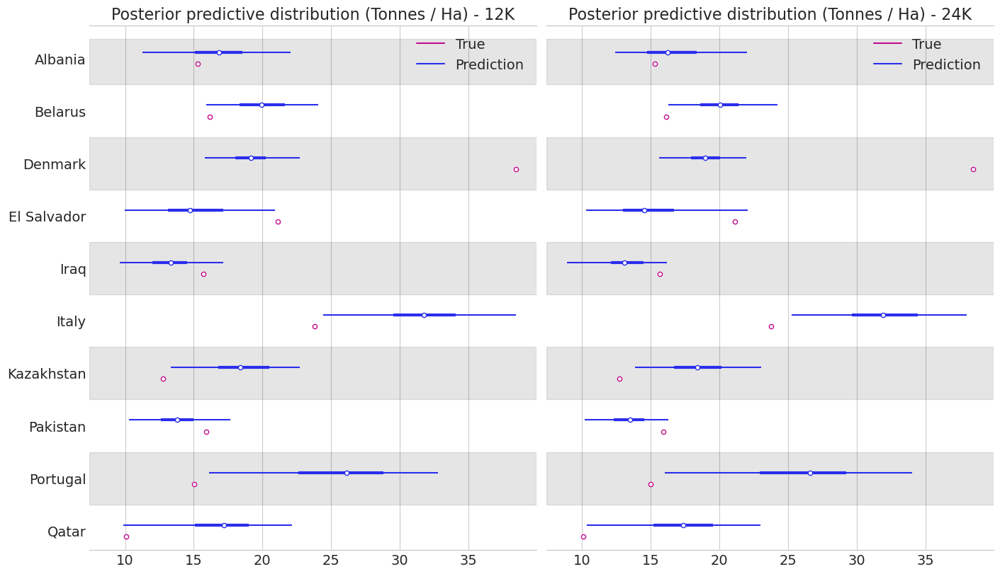

In [41]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad1']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 12K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plt.show()

[]

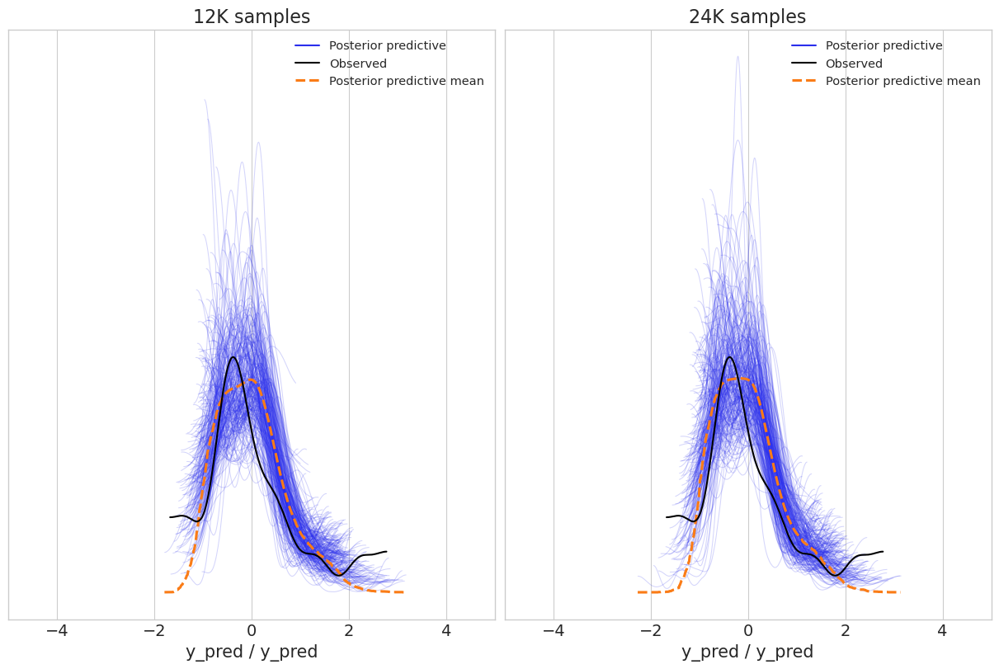

In [15]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [54]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K: {} \t MAE 12K: {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K: {} \t MAE 24K: {}".format(r2, mae))

R2  12K: 0.556758027645767 	 MAE 12K: 51737.180388898705
R2  24K: 0.5774306073958658 	 MAE 24K: 50317.05793169423


In [267]:
results['expquad2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More more samples

In [145]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [14]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 1151 seconds.
The number of effective samples is smaller than 25% for some parameters.


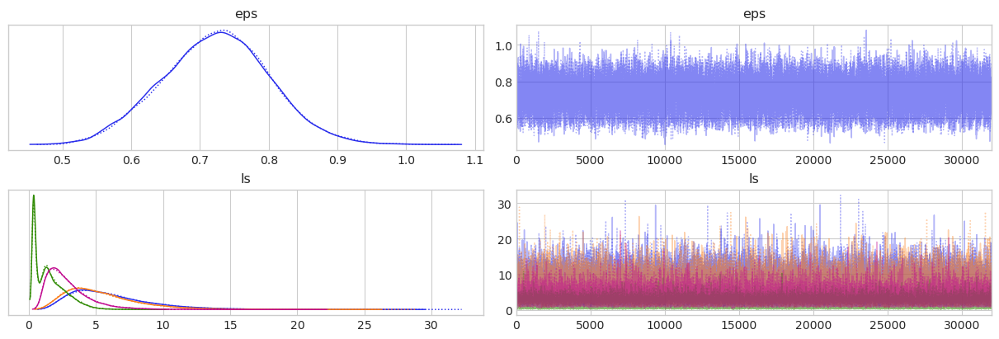

In [214]:
plot_trace(trace, ['eps', 'ls'])

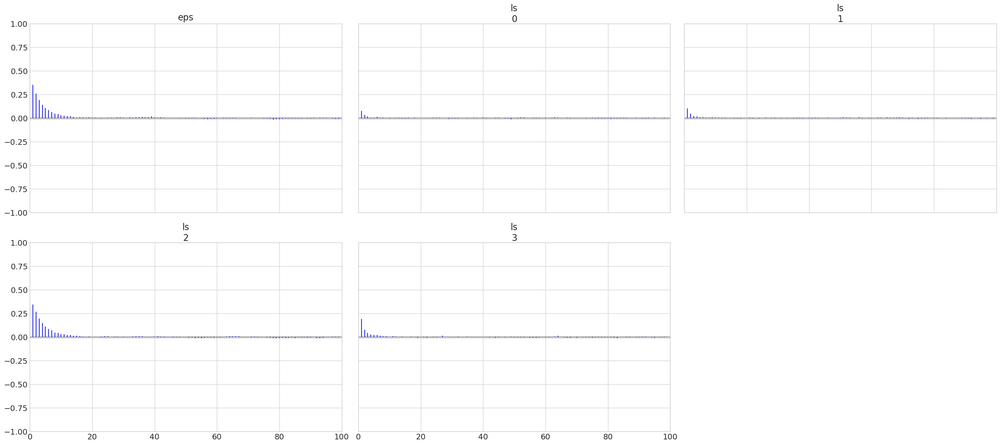

In [215]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [16]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

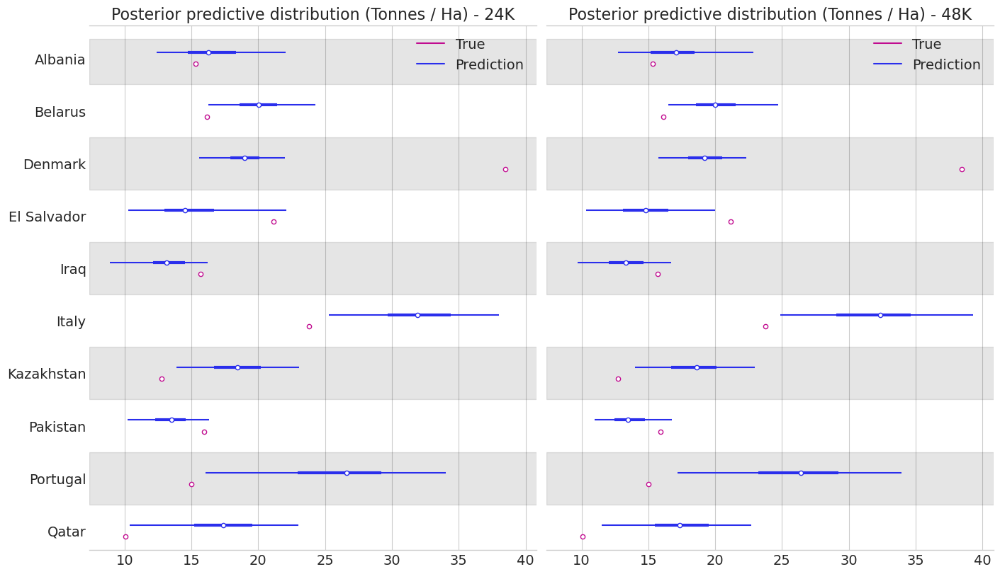

In [43]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plt.show()

[]

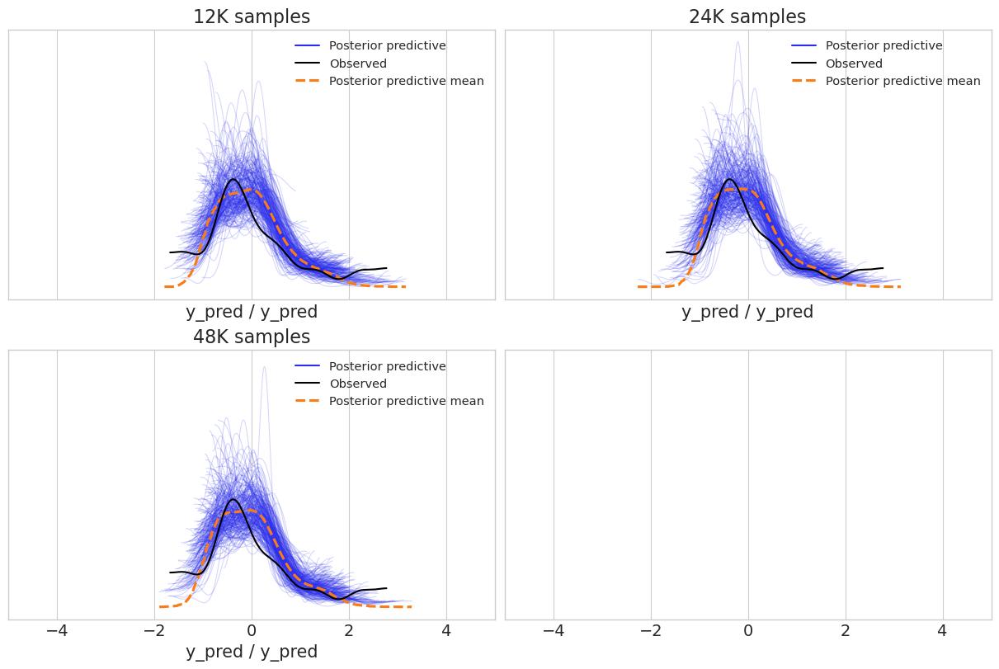

In [19]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax2.set_xlim((-5, 5))
plt.plot()

In [57]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K: {} \t MAE 12K: {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K: {} \t MAE 24K: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  48K: {} \t MAE 48K: {}".format(r2, mae))

R2  12K: 0.556758027645767 	 MAE 12K: 51737.180388898705
R2  24K: 0.5419334379649081 	 MAE 24K: 52369.993574192304
R2  48K: 0.546291973852988 	 MAE 48K: 52270.81134962288


In [19]:
results['expquad3'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

###  Thousand of samples

In [5]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

# Sample from posterior
with model:
    trace = pm.sample(
        draws=128_000, tune=64_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 64_000 tune and 128_000 draw iterations (128_000 + 256_000 draws total) took 4578 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


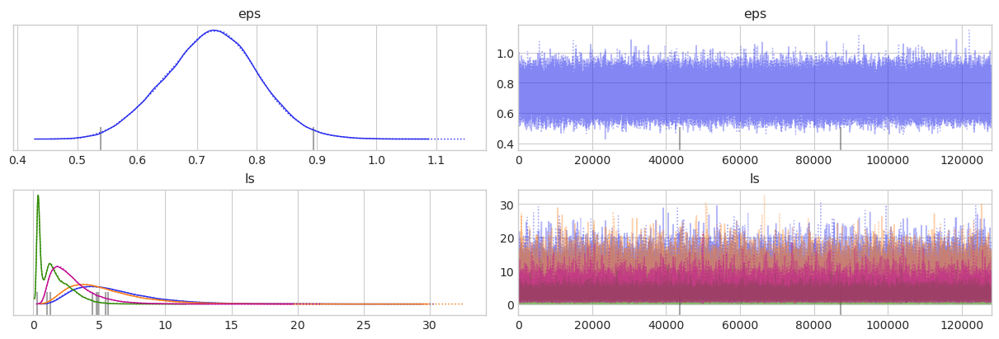

In [217]:
plot_trace(trace, ['eps', 'ls'])

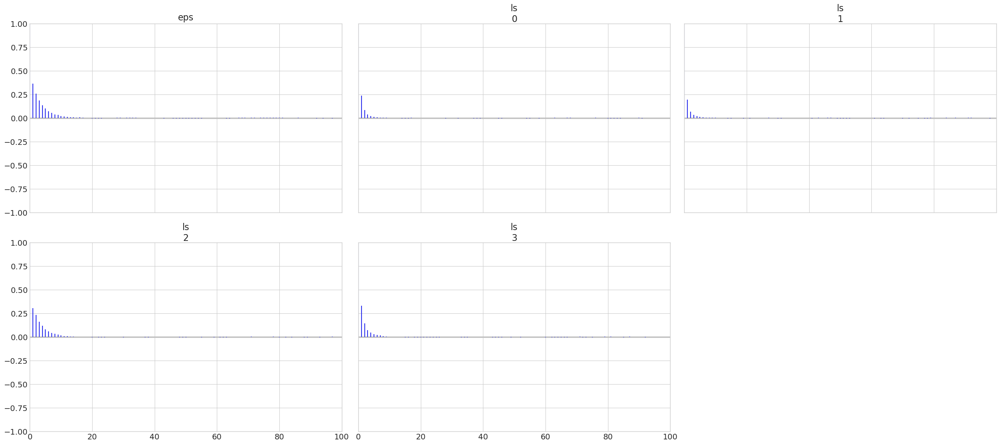

In [218]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [7]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

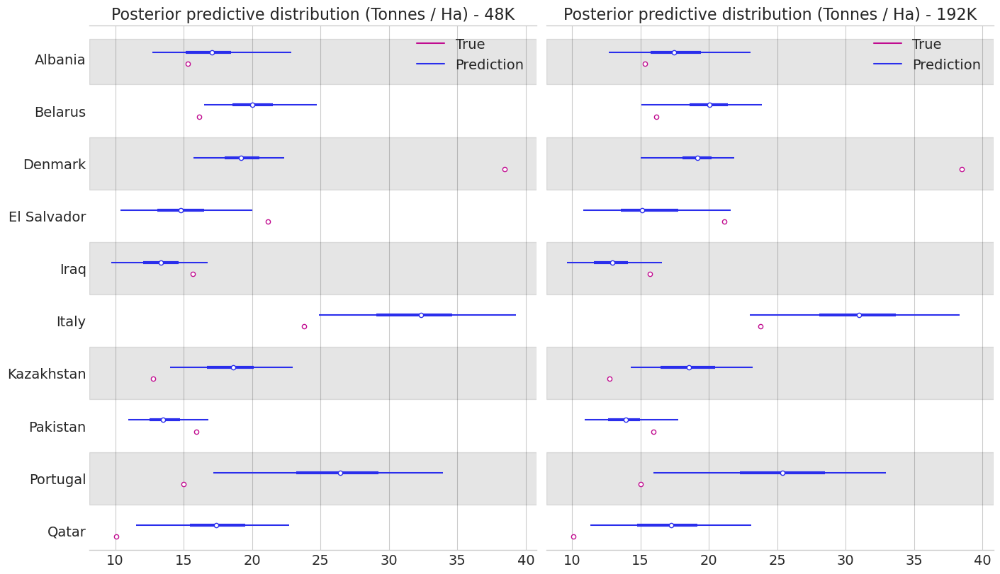

In [45]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad3']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 192K')
plt.show()

In [59]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K : {} \t MAE 12K : {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K : {} \t MAE 24K : {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  48K : {} \t MAE 48K : {}".format(results['expquad3']['r2'], results['expquad3']['mae']))
print("R2  192K: {} \t MAE 192K: {}".format(r2, mae))

R2  12K : 0.556758027645767 	 MAE 12K : 51737.180388898705
R2  24K : 0.5419334379649081 	 MAE 24K : 52369.993574192304
R2  48K : 0.546291973852988 	 MAE 48K : 52270.81134962288
R2  192K: 0.5774306073958658 	 MAE 192K: 50317.05793169423


[]

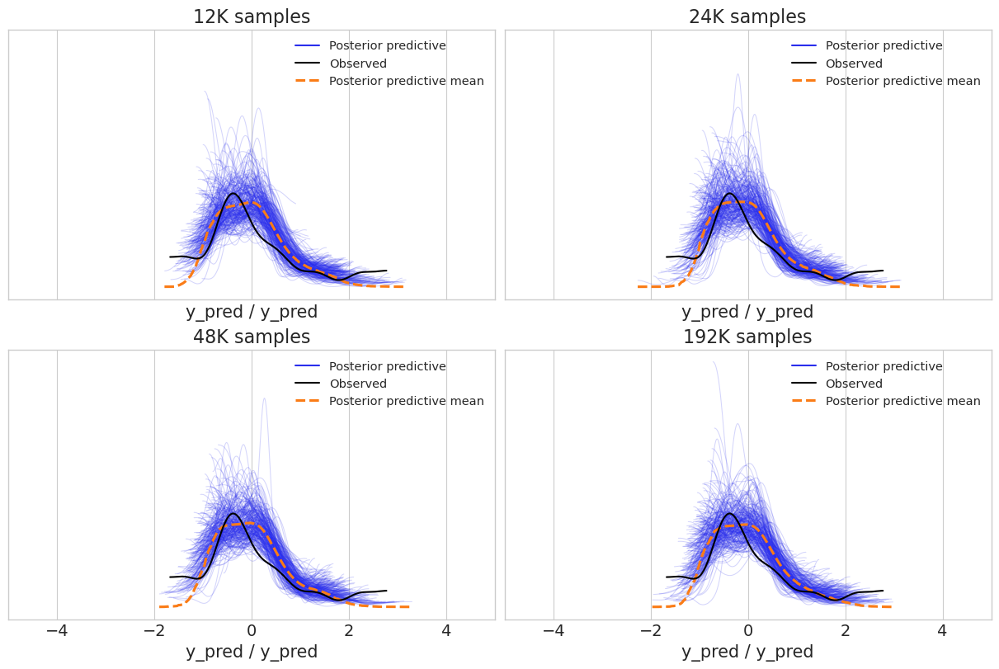

In [47]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')
ax4.set_title('192K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad3']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax4)
ax2.set_xlim((-5, 5))
plt.plot()

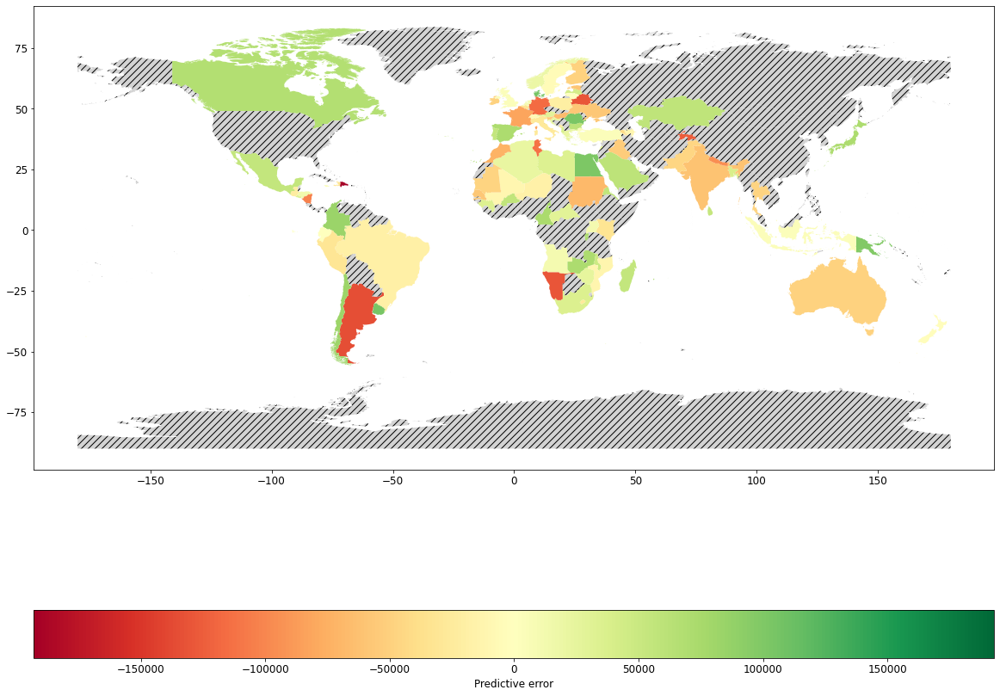

In [9]:
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data)

In [11]:
results['expquad4'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Another model, with polynomial kernel, grade 2

The polynomial kernel is a generalization of the linear.
It corresponds to a polynomial model just as the linear kernel corresponds to a linear one.
$$
k(x, x') = \big[(x - c)(x' - c) + \mathcal{offset}\big]^d
$$

In [60]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5, shape=n_features)
    grade = 2
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [61]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16000, tune=8000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1068 seconds.
There were 1680 divergences after tuning. Increase `target_accept` or reparameterize.
There were 3031 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


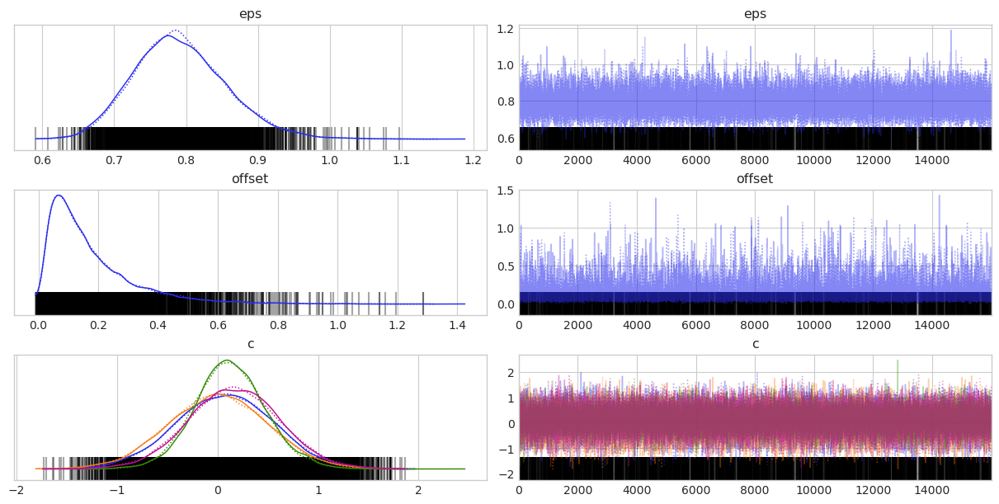

In [63]:
plot_trace(trace, ['eps', 'offset', 'c'])

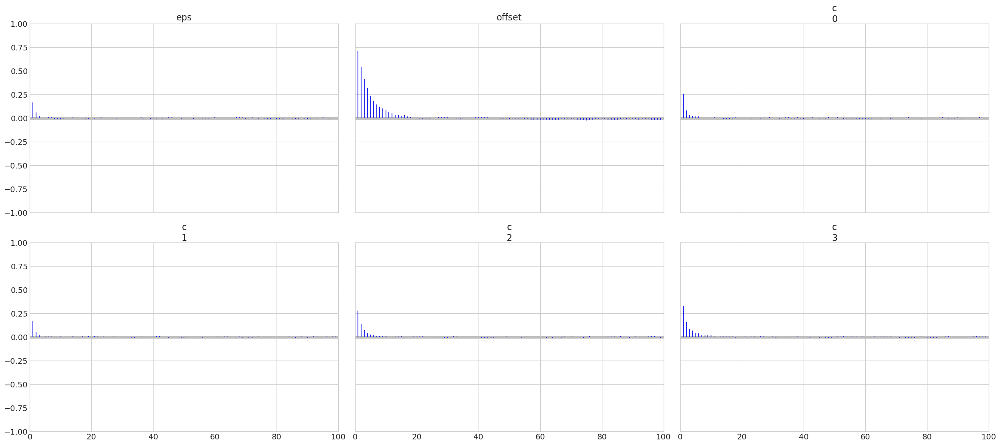

In [64]:
az.plot_autocorr(trace, var_names=['eps', 'offset', 'c'], combined=True)
plt.show()

In [65]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')
plot_test(pred_samples[test_indices].T, y_mean, y_stddev,
          y_test_data, countries[test_indices])

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


LinAlgError: Matrix is not positive definite

Not able to sample from conditional as the matrix is not positive definite

In [ ]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

In [168]:
results['poly'] = {
    'trace': trace,
    'pred_samples': None,
    'mae': None,
    'r2': None,
}

### Grade 3

In [5]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 8)
    c = pm.Normal('c', 0, 8, shape=n_features)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 1010 seconds.
There were 3370 divergences after tuning. Increase `target_accept` or reparameterize.
There were 8282 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


In [13]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 8)
    c = pm.Normal('c', 0, 8, shape=n_features)
    mu = 3
    grade = pm.Poisson("grade", mu)
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Sequential sampling (2 chains in 1 job)
CompoundStep
>NUTS: [eps, c, offset]
>Metropolis: [grade]


TypeError: expected type_num 3 (NPY_INT16) got 9
Apply node that caused the error: Elemwise{Composite{Cast{float64}(Switch(Cast{int8}(GE(i0, i1)), ((i2 + (i3 * i0)) - scalar_gammaln((i4 + i0))), i5))}}(InplaceDimShuffle{}.0, TensorConstant{0}, TensorConstant{-3.0}, TensorConstant{1.0986123085021973}, TensorConstant{1}, TensorConstant{-inf})
Toposort index: 10
Inputs types: [TensorType(int16, scalar), TensorType(int8, scalar), TensorType(float32, scalar), TensorType(float32, scalar), TensorType(int16, scalar), TensorType(float32, scalar)]
Inputs shapes: [(), (), (), (), (), ()]
Inputs strides: [(), (), (), (), (), ()]
Inputs values: [array(1, dtype=int64), array(0, dtype=int8), array(-3., dtype=float32), array(1.0986123, dtype=float32), array(1, dtype=int16), array(-inf, dtype=float32)]
Outputs clients: [[MakeVector{dtype='float64'}(Elemwise{Composite{Cast{float64}((i0 * (i1 + (i2 * sqr(i3)))))}}.0, Elemwise{Composite{Cast{float64}((i0 * i1))}}.0, Elemwise{Composite{Cast{float64}(Switch(Cast{int8}(GE(i0, i1)), ((i2 + (i3 * i0)) - scalar_gammaln((i4 + i0))), i5))}}.0, Elemwise{Composite{Cast{float64}((Switch(Cast{int8}(GE(i0, i1)), (i2 - log1p(sqr((i3 * i0)))), i4) + i5))}}.0, __logp_y_pred)]]

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.
HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

### A simple function

In [92]:
fun = lambda x: x**3 - 7*x**2 - 2*x + 10
fun = np.vectorize(fun)

In [93]:
x_fun = np.linspace(-10, 10, 100)

In [94]:
y_fun = fun(x_fun)

In [95]:
x_std_fun, x_mean_fun, x_stddev_fun = standardize_data(x_fun)
y_std_fun, y_mean_fun, y_stddev_fun = standardize_data(y_fun)

In [148]:
y_std_noise = y_std_fun + np.random.normal(0,0.1,100)

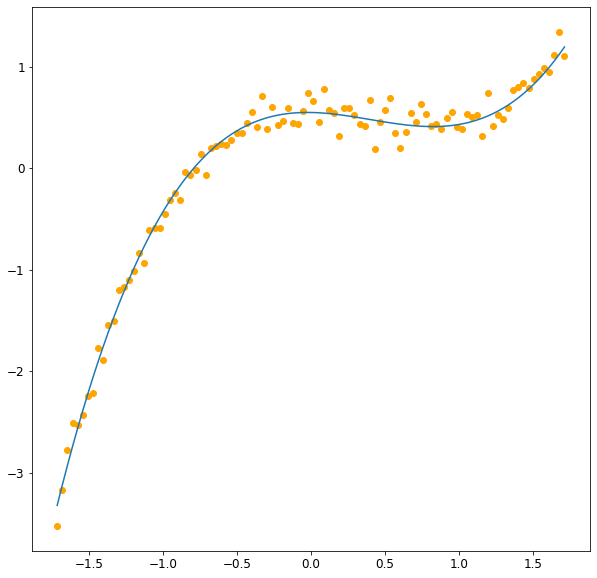

In [153]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_std_fun, y_std_noise, c='orange')
plt.show()

In [152]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(1, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=np.expand_dims(x_std_fun, axis=1), y=y_std_noise, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 155 seconds.
There were 83 divergences after tuning. Increase `target_accept` or reparameterize.
There were 311 divergences after tuning. Increase `target_accept` or reparameterize.


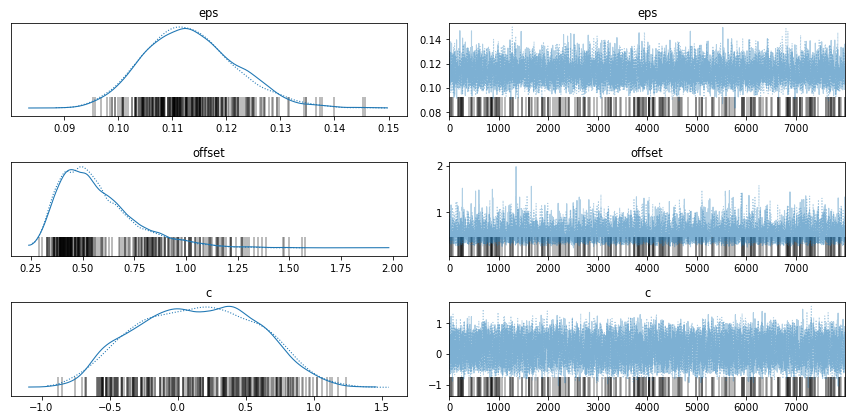

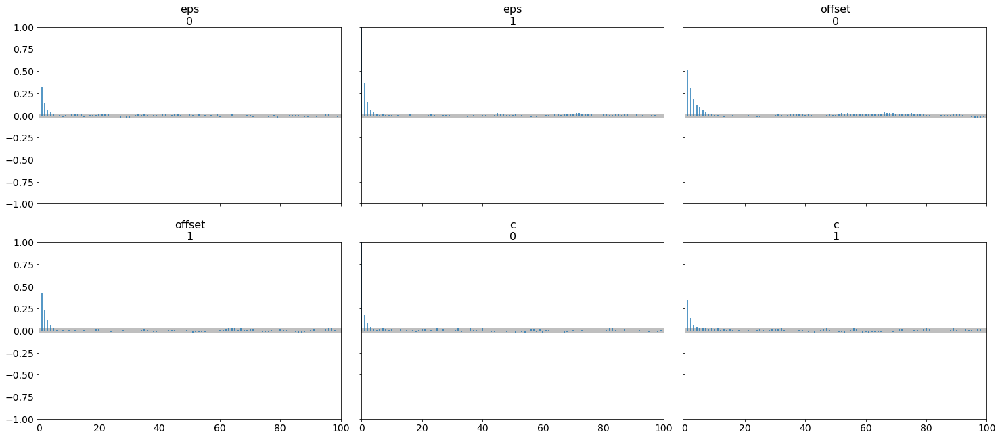

In [154]:
plot_trace(trace, ['eps', 'offset', 'c'])

In [155]:
x_new = (np.random.rand(100) * 3) - 1.5
print(np.expand_dims(x_new, axis=1).shape)
y_new = gp_model.sample_conditional(trace, np.expand_dims(x_new, axis=1), 'f_pred')

(100, 1)


C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


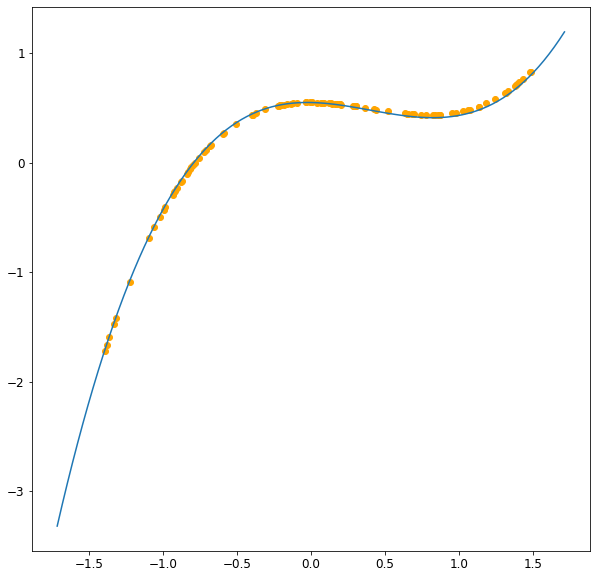

In [156]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_new, np.median(y_new, axis=0), c='orange')
plt.show()

## Exponential Kernel

Similar to Exponential Quadratic, but with absolute value instead of the square
$$
\phi(x,x') = \exp \left( -\frac{||x-x'||}{2\ell^2} \right)
$$

In [88]:
def covariance_matrix(x, kf, **kwargs):
    x1 = np.expand_dims(x, axis=0)
    x2 = np.expand_dims(x, axis=1)
    return kf(x1, x2, **kwargs)

def gp_sample(kf, xmin=-4.0, xmax=4.0, n_samples=150, return_cov=False, **kwargs):
    x = np.linspace(xmin, xmax, n_samples)
    m = np.zeros(n_samples)
    if not return_cov:
        k = covariance_matrix(x, kf, **kwargs)
    else:
        x1 = np.expand_dims(x, axis=1)
        k = kf(x1, x1, **kwargs)
    y = np.random.multivariate_normal(mean=m, cov=k)
    return x, y, k

def plot_gp_sample(name, kf, kwargs_ls, n_functions=3, return_cov=False, multicol=1, col=0, subplots=None):
    np.random.seed(42)
    ls_kwargs = [dict(zip(kwargs_ls, v)) for v in zip(*kwargs_ls.values())]
    plt.rcParams['axes.grid'] = False
    ncols = 2 * multicol
    if col == 0:
        fig, axs = plt.subplots(nrows=len(ls_kwargs), ncols=ncols, figsize=(15, 3.5 * len(ls_kwargs)))
    else:
        fig, axs = subplots
    if len(ls_kwargs) == 1:
        kwargs = ls_kwargs[0]
        axs[col * 2].set_title('{} {}'.format(name, kwargs))
        for k in range(n_functions):
            x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
            axs[col * 2].plot(x, y)
        axs[2 * col + 1].xaxis.tick_top()
        axs[2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].invert_yaxis()
        im = axs[2 * col + 1].imshow(k, interpolation='antialiased')
        plt.colorbar(im, ax=axs[2 * col + 1]) 
    else:
        for i, kwargs in enumerate(ls_kwargs):
            axs[i, col * 2].set_title('{} {}'.format(name, kwargs))
            for k in range(n_functions):
                x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
                axs[i, col * 2].plot(x, y)
            axs[i, 2 * col + 1].xaxis.tick_top()
            axs[i, 2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].invert_yaxis()
            im = axs[i, 2 * col + 1].imshow(k, interpolation='antialiased')
            plt.colorbar(im, ax=axs[i, 2 * col + 1])
    fig.tight_layout()
    return fig, axs
    
def kernel_expquad(x1, x2, l): return np.exp(-((x1 - x2) ** 2.0) / (2 * l ** 2.0))
def kernel_exp(x1, x2, l): return np.exp(-np.abs(x1 - x2) / (2 * l ** 2.0))

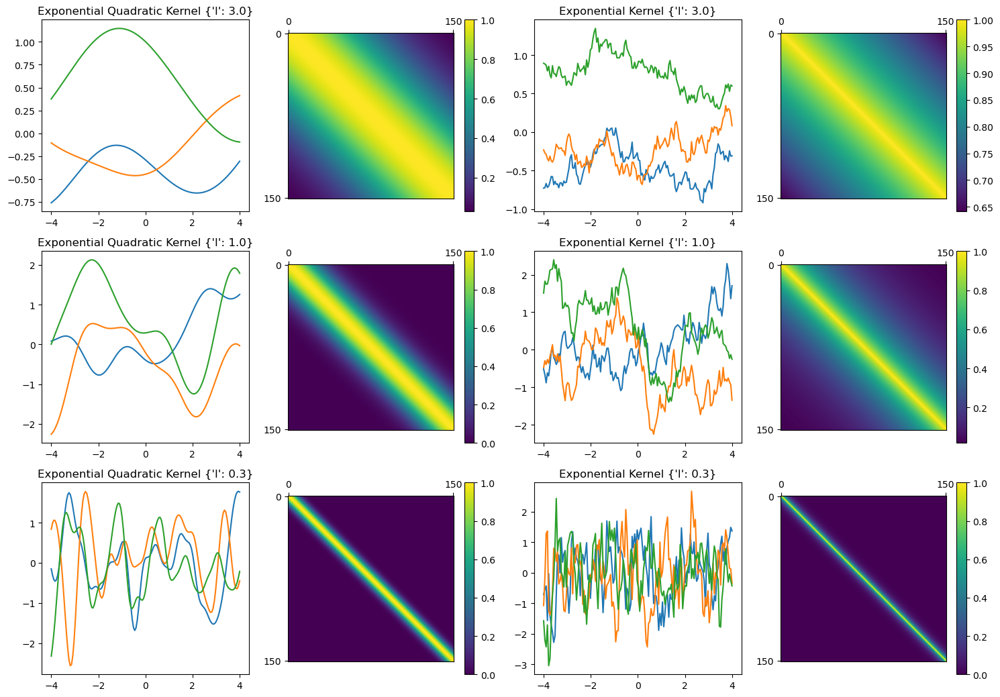

In [89]:
with plt.style.context('default'):
    subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=0)
    plot_gp_sample("Exponential Kernel", kernel_exp, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=1, subplots=subplots)
    plt.show()

In [12]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [13]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 435 seconds.


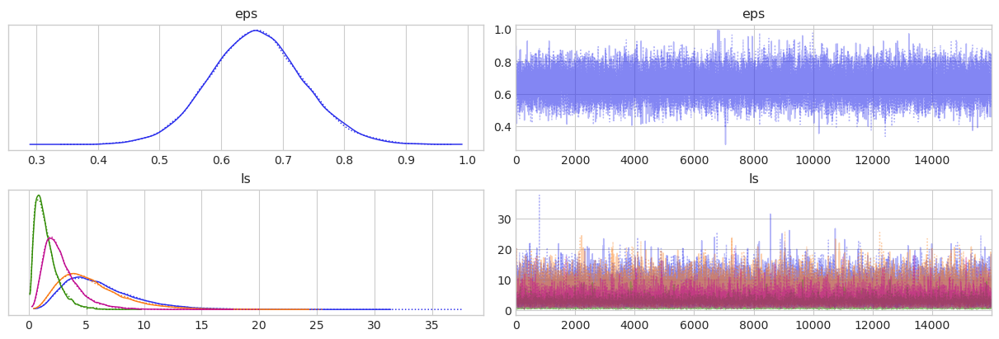

In [225]:
plot_trace(trace, ['eps', 'ls'])

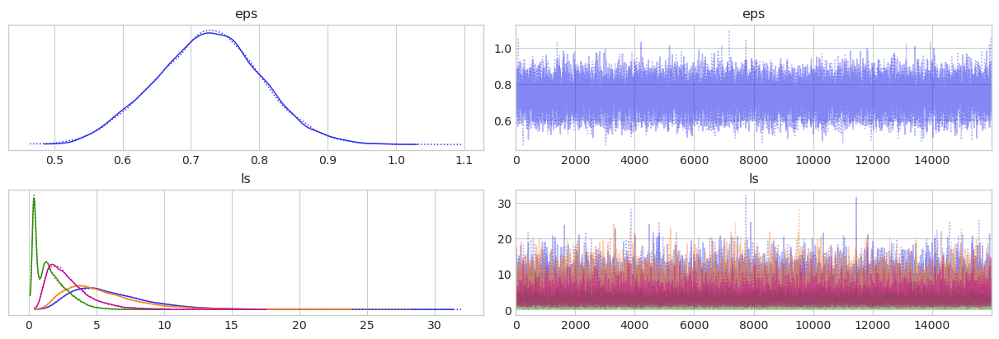

In [62]:
plot_trace(results['expquad2']['trace'], ['eps', 'ls'])

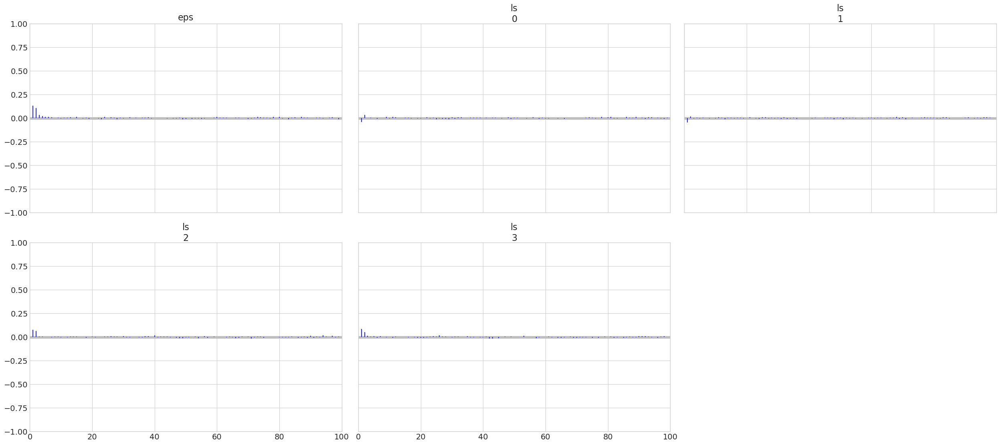

In [226]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [15]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

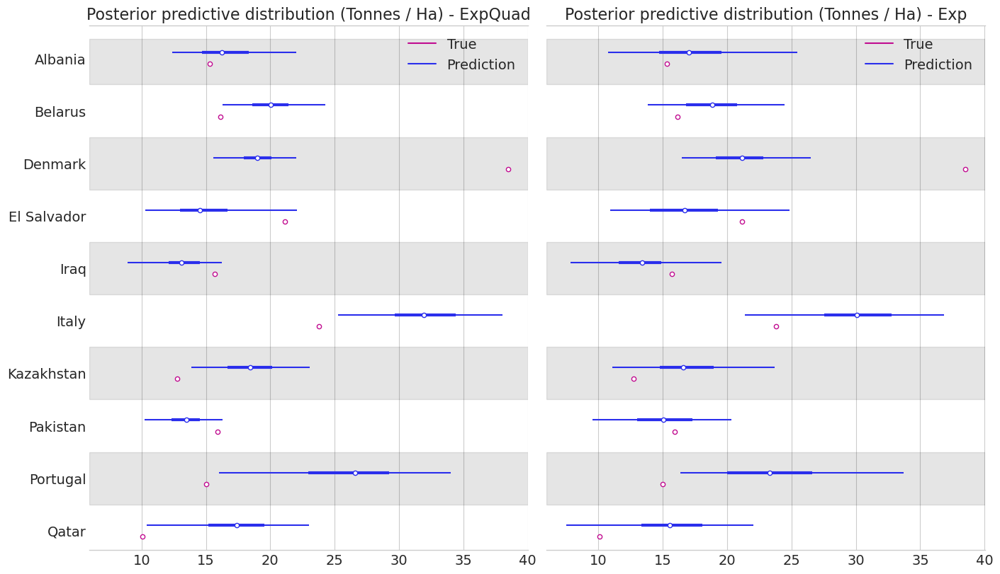

In [67]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plt.show()

[]

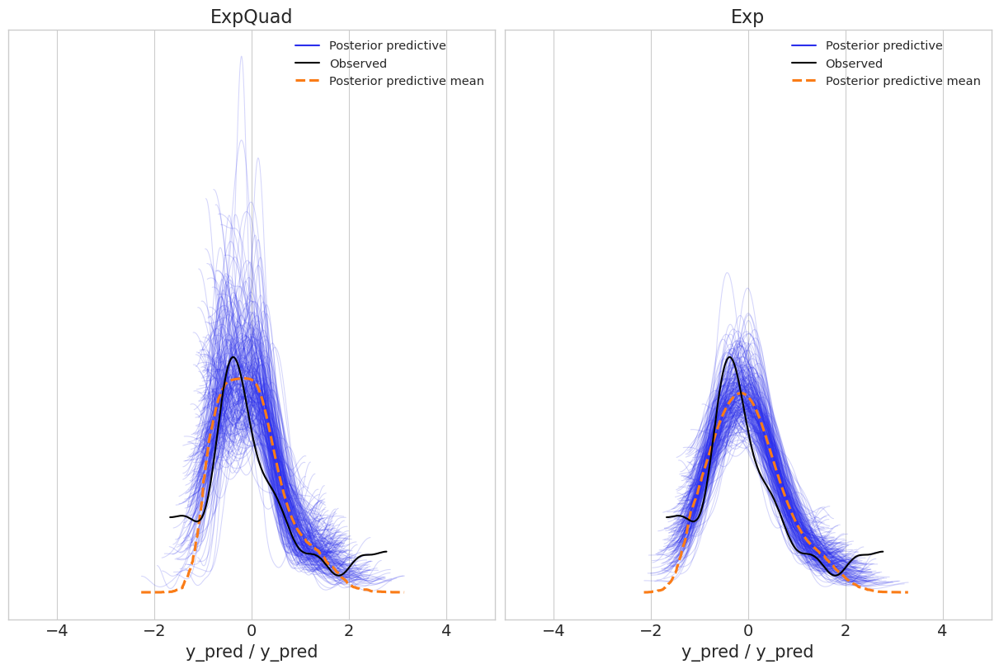

In [69]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('ExpQuad')
ax2.set_title('Exp')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [75]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  ExpQuad: {} \t MAE ExpQuad: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  Exp    : {} \t MAE Exp    : {}".format(r2, mae))

R2  ExpQuad: 0.5419334379649081 	 MAE ExpQuad: 52369.993574192304
R2  Exp    : 0.7085415826687245 	 MAE Exp    : 41760.08853891286


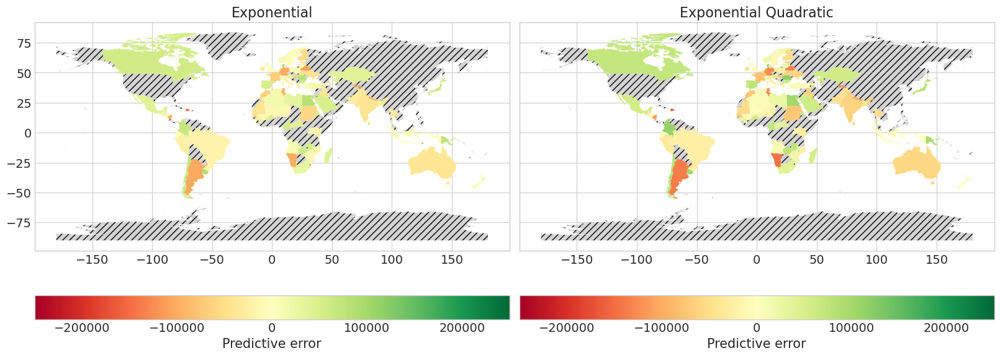

In [74]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 10), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
world_error_plot(world, results['expquad2']['pred_samples'], y_mean, y_stddev, y_data, axes=ax2, max_error=250_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax1, max_error=250_000)

In [18]:
results['exp'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Rational Exponential Kernel

$$
\phi(x,x') = \exp \left(1 + \frac{||x-x'||**2}{2\ell^2} \right)^-\alpha
$$

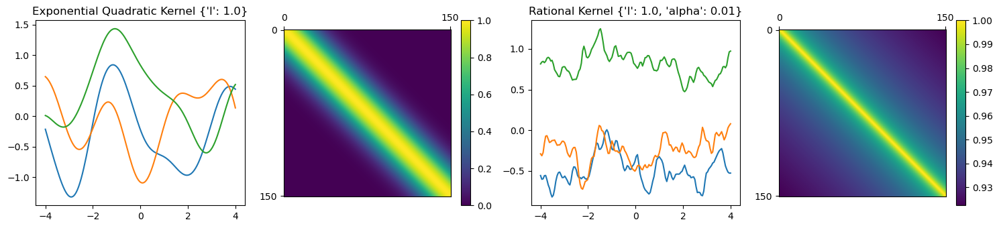

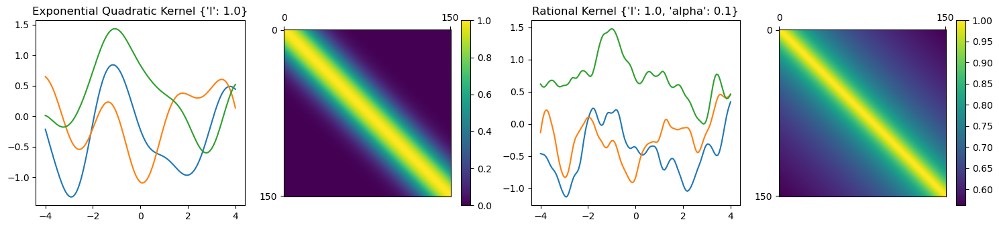

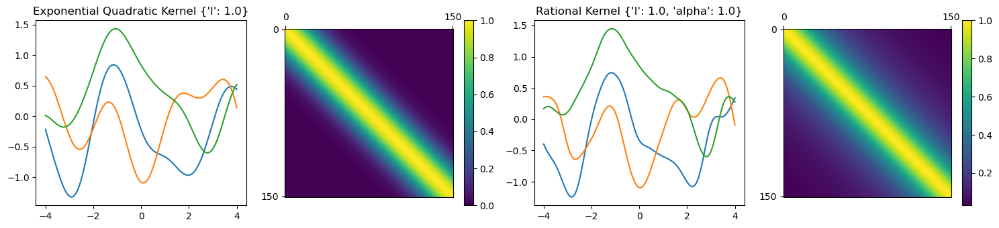

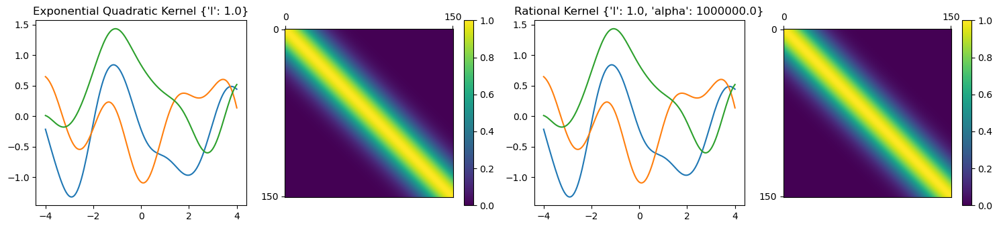

In [102]:
def kernel_ratquad(x, y, l, alpha): return (1 + ((x - y)**2)/(2*alpha*l**2))**-alpha
args = [
    ({'l': [1.0]}, {'alpha': [0.01]}),
    ({'l': [1.0]}, {'alpha': [0.1]}),
    ({'l': [1.0]}, {'alpha': [1.0]}),
    ({'l': [1.0]}, {'alpha': [1000000.0]}),
]
with plt.style.context('default'):
    for arg in args:
        subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls=arg[0], multicol=2, col=0)
        plot_gp_sample("Rational Kernel", kernel_ratquad, kwargs_ls={**arg[0], **arg[1]}, multicol=2, col=1, subplots=subplots)
        plt.show()

In [ ]:
#### Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.HalfNormal('ls', 0.5)
    alpha = pm.Gamma('alpha', 2.0, 0.5)
    # Instantiate the covariance function
    cov = pm.gp.cov.RatQuad(n_features, ls=ls, alpha=alpha) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

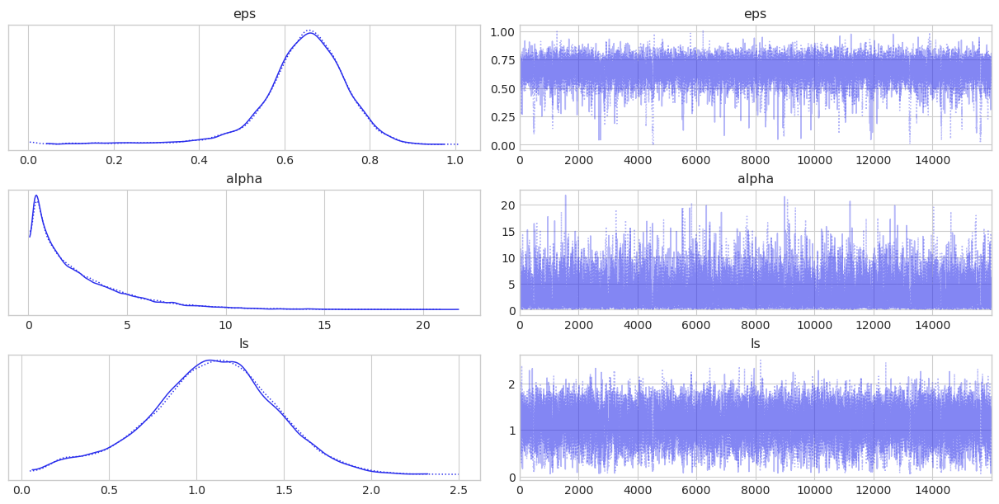

In [14]:
plot_trace(trace, ['eps', 'alpha', 'ls'])

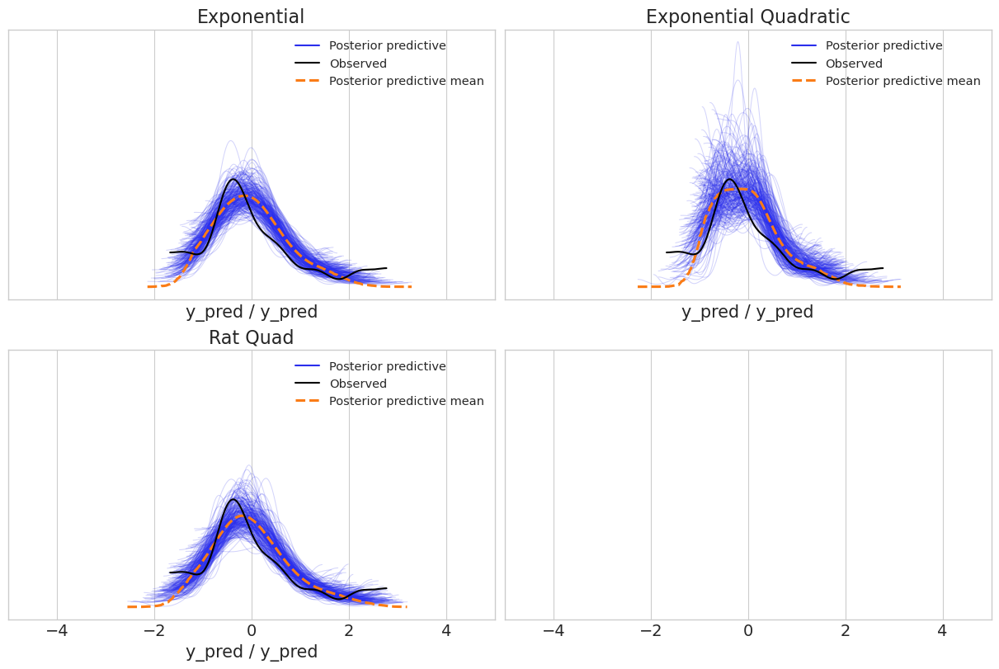

In [22]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Rat Quad')
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [18]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

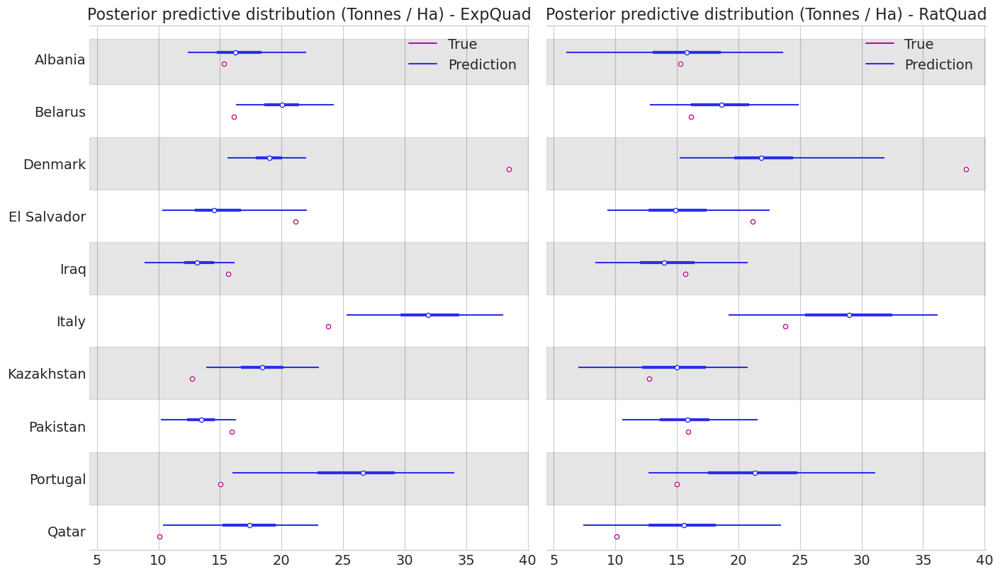

In [19]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - RatQuad')
plt.show()

Major flexibility has allowed us to reach better results and catch more uncertainty

In [105]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("ExpQuad: R2: {} \t MAE: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("Exp    : R2: {} \t MAE: {}".format(results['exp']['r2'], results['exp']['mae']))
print("RatQuad: R2: {} \t MAE: {}".format(r2, mae))

ExpQuad: R2: 0.5419334379649081 	 MAE: 52369.993574192304
Exp    : R2: 0.7085415826687245 	 MAE: 41760.08853891286
RatQuad: R2: 0.7549170819112382 	 MAE: 37173.93974355471


In [99]:
results['rat'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Matern32 Kernel

The Matern kernel with $\nu$ = 3/2
$$
k(x, x') = \Bigg( 1 + \frac{\sqrt{3(x - x')^2}}{\mathit{l}} \Bigg) exp \Bigg[ - \frac{\sqrt{3(x - x')^2}}{\mathit{l}} \Bigg]
$$

Kernel used in applications of multivariate statistical analysis on metric spaces.
It is a generalization of the **RBF** kernel, generalized by the parameter $\nu$

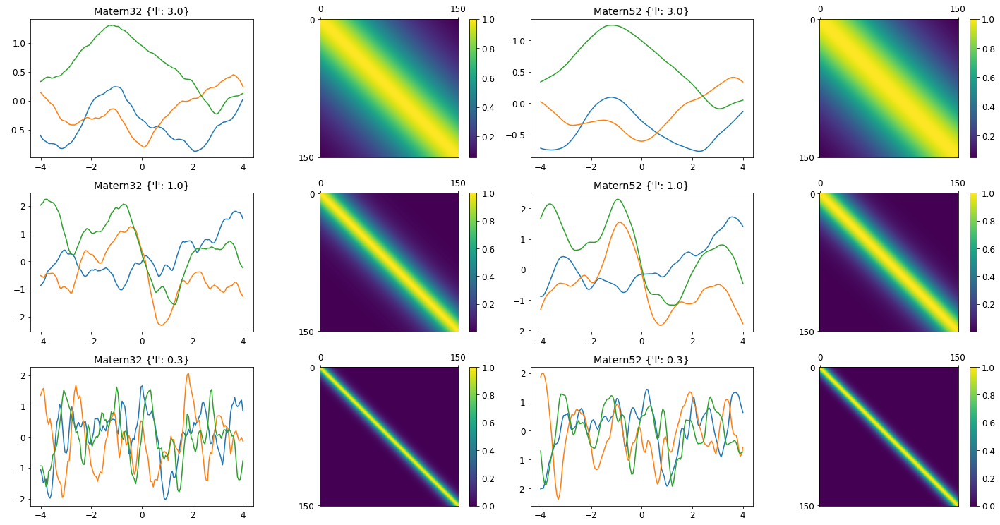

In [96]:
def matern32(x, y, l): return np.array(pm.gp.cov.Matern32(1, ls=l)(x, y).eval())
def matern52(x, y, l): return np.array(pm.gp.cov.Matern52(1, ls=l)(x, y).eval())
subplots = plot_gp_sample("Matern32", matern32, return_cov=True, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=0)
plot_gp_sample("Matern52", matern52, return_cov=True, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=1, subplots=subplots)
plt.show()
#plot_gp_sample("Exponential Kernel", kernel_exp, kwargs_ls={'l': [3.0, 1.0, 0.3]})

In [4]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Matern32(n_features, ls=ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [5]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 499 seconds.


Recall Exp results

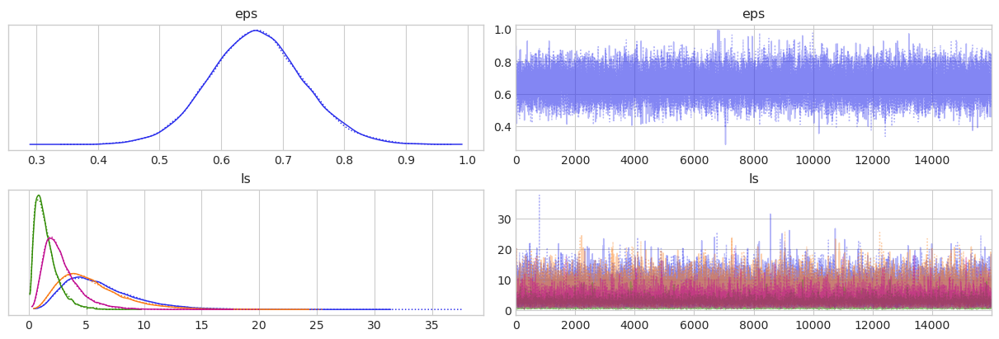

In [77]:
plot_trace(results['exp']['trace'], ['eps', 'ls'])

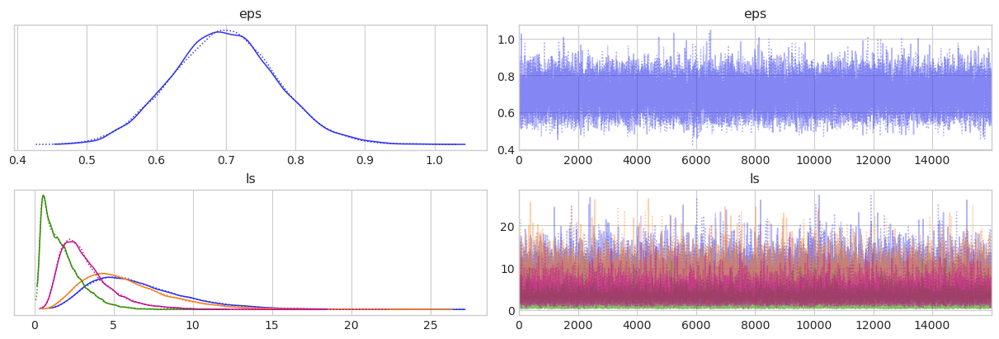

In [228]:
plot_trace(trace, ['eps', 'ls'])

Recall ExpQuad results

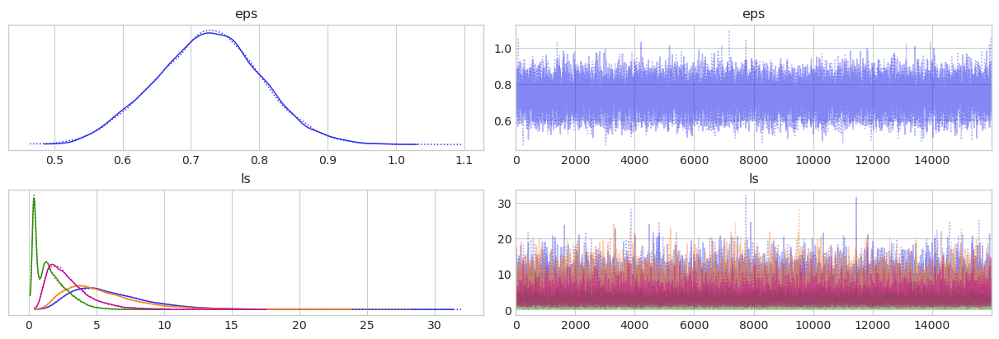

In [76]:
plot_trace(results['expquad2']['trace'], ['eps', 'ls'])

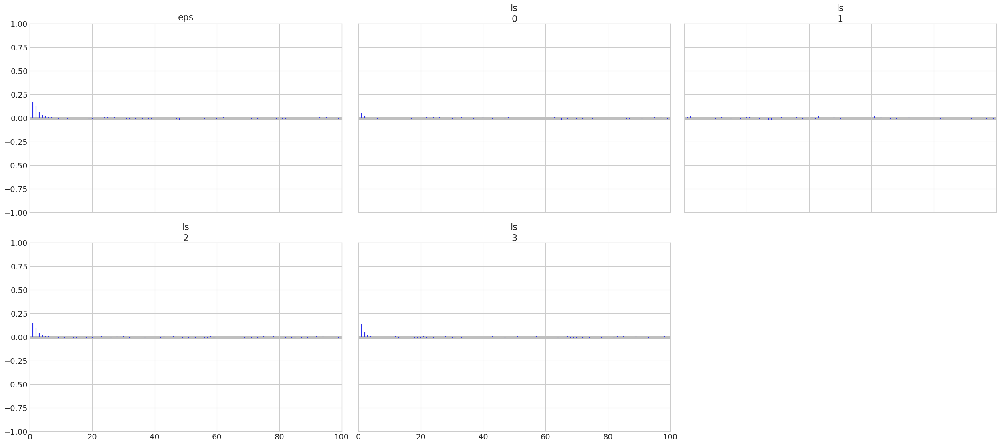

In [229]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [7]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

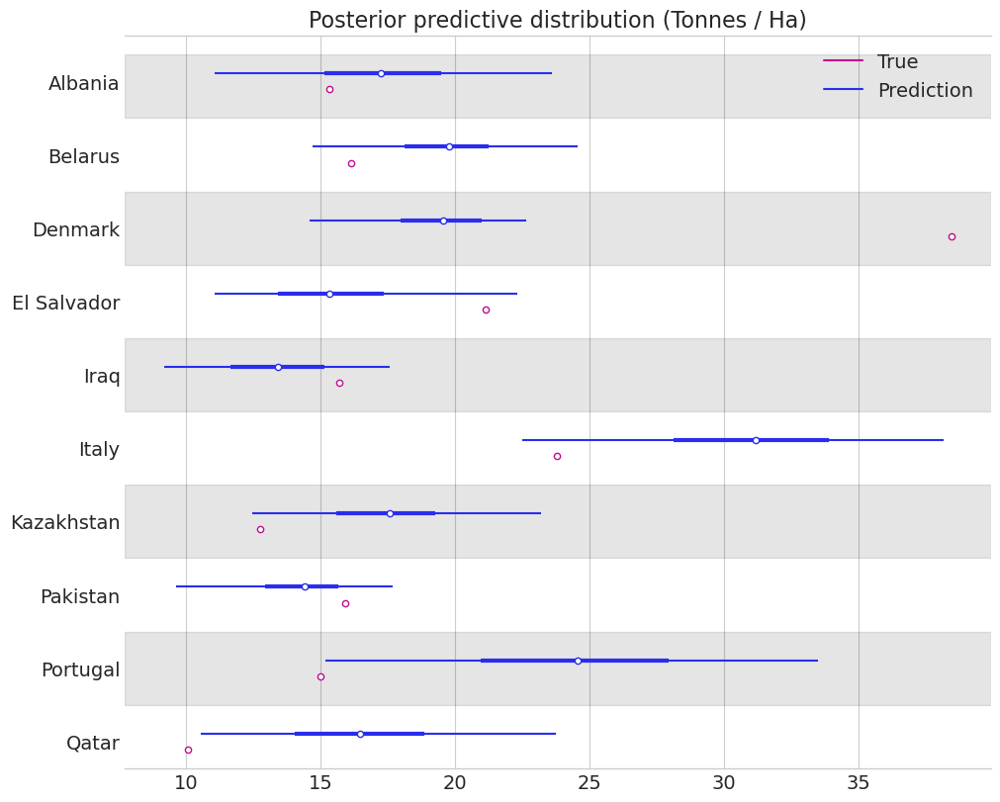

In [124]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

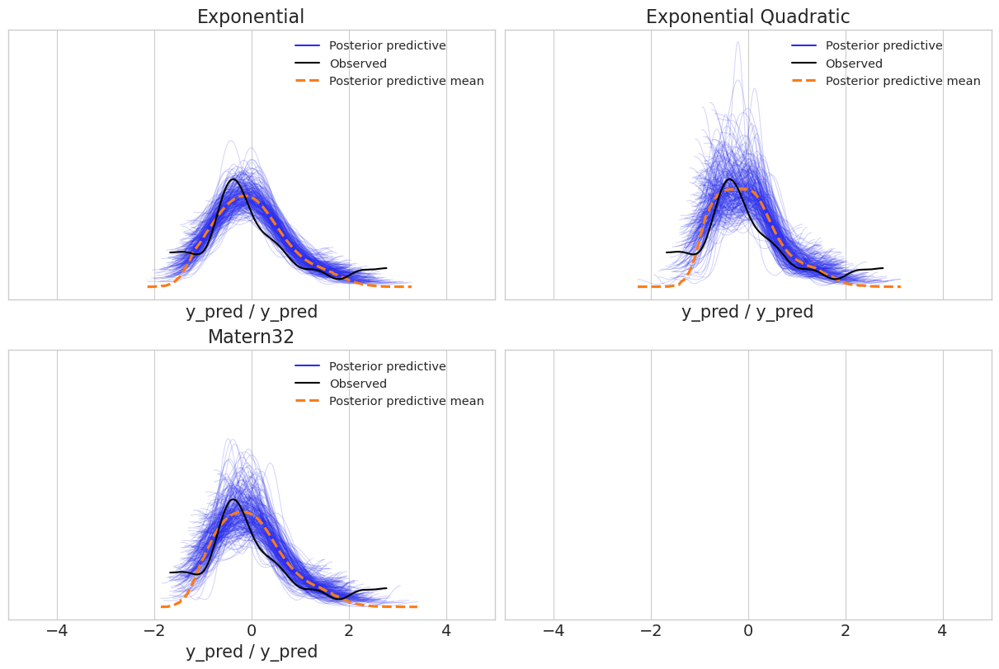

In [81]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Matern32')
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [8]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.611737109609299
MAE: 48324.3842487406


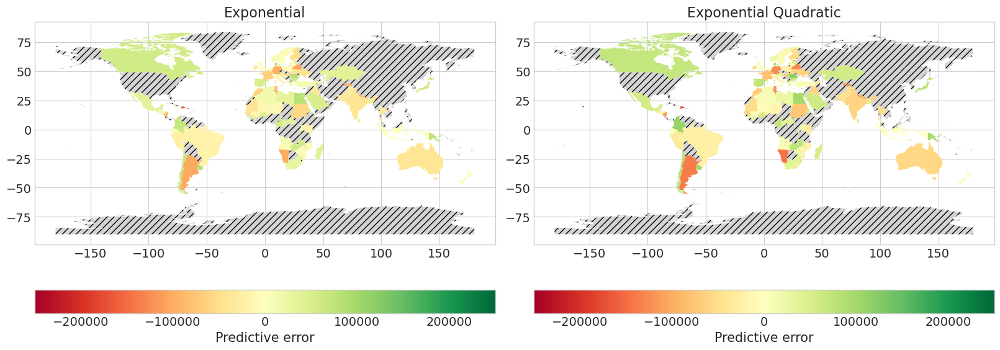

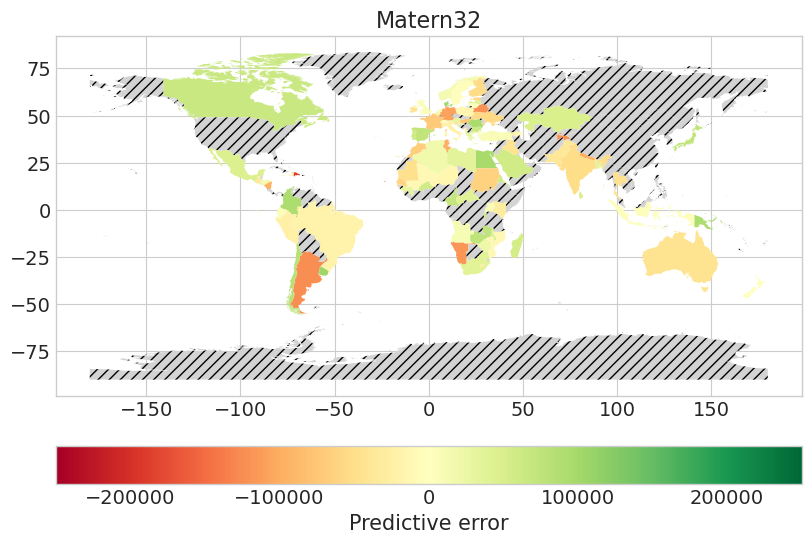

In [83]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 10))
fig, ax3 = plt.subplots(figsize=(8, 6))
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Matern32')
world_error_plot(world, results['exp']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=250000)
world_error_plot(world, results['expquad2']['pred_samples'], y_mean, y_stddev, y_data, axes=ax2, max_error=250000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax3, max_error=250000)
plt.show()

In [11]:
results['matern32'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Combyning kernels

### Summing
Summing kernels can be interpreted as a logical OR, value is high when at least one is high

In [9]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) + \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [10]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 753 seconds.


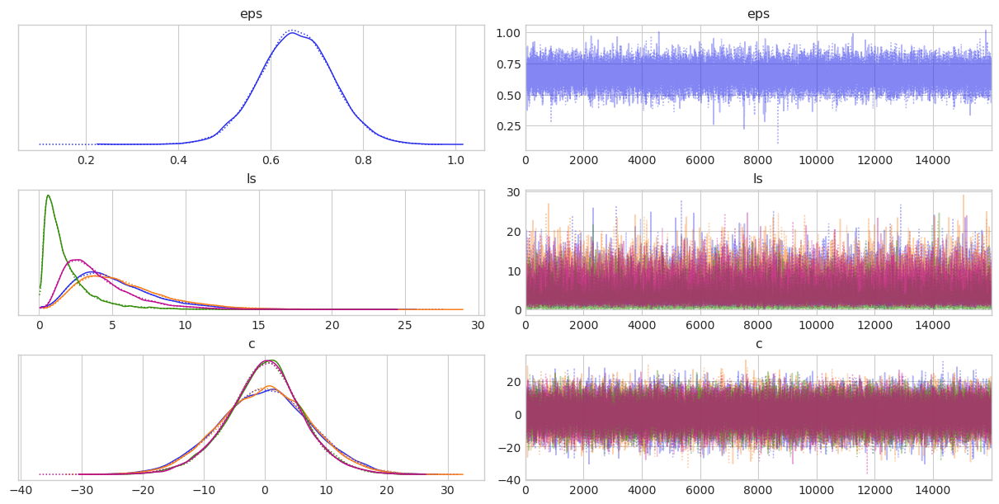

In [11]:
plot_trace(trace, ['eps', 'ls', 'c'])

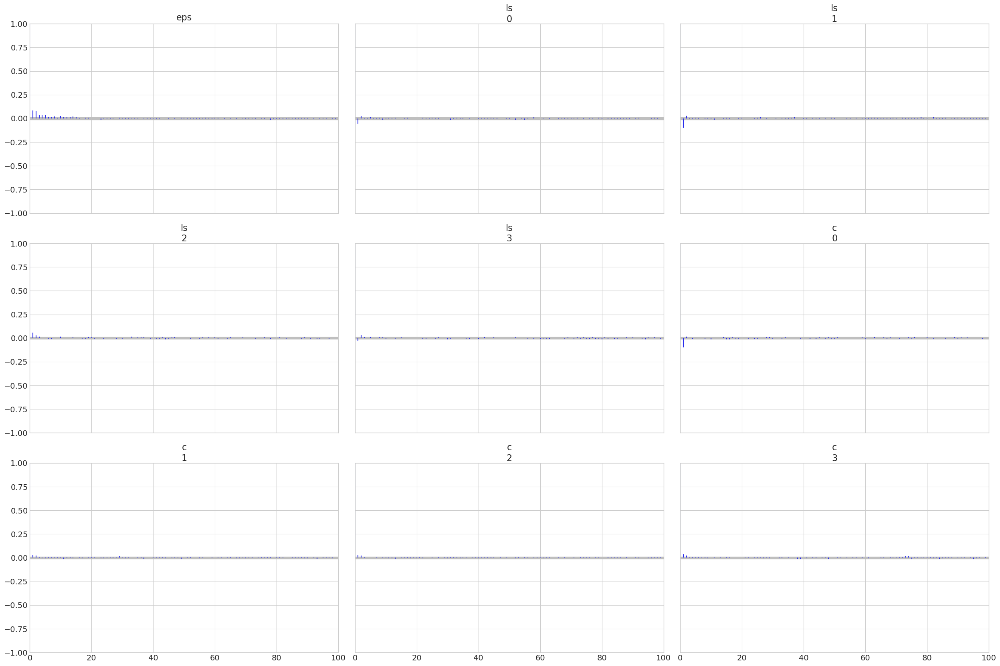

In [12]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [13]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


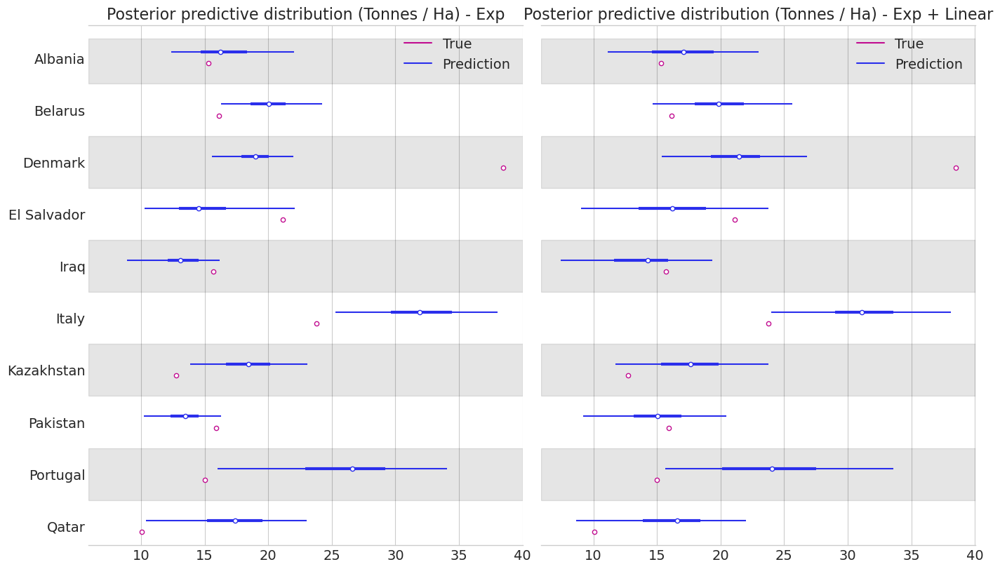

In [19]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp + Linear')
plt.show()

In [22]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp: R2: {} \t MAE: {}".format(results['exp']['r2'], results['exp']['mae']))
print("Sum: R2: {} \t MAE: {}".format(r2, mae))

Exp: R2: 0.7085415826687245 	 MAE: 41760.08853891286
Sum: R2: 0.7031147883657496 	 MAE: 42191.59230212307


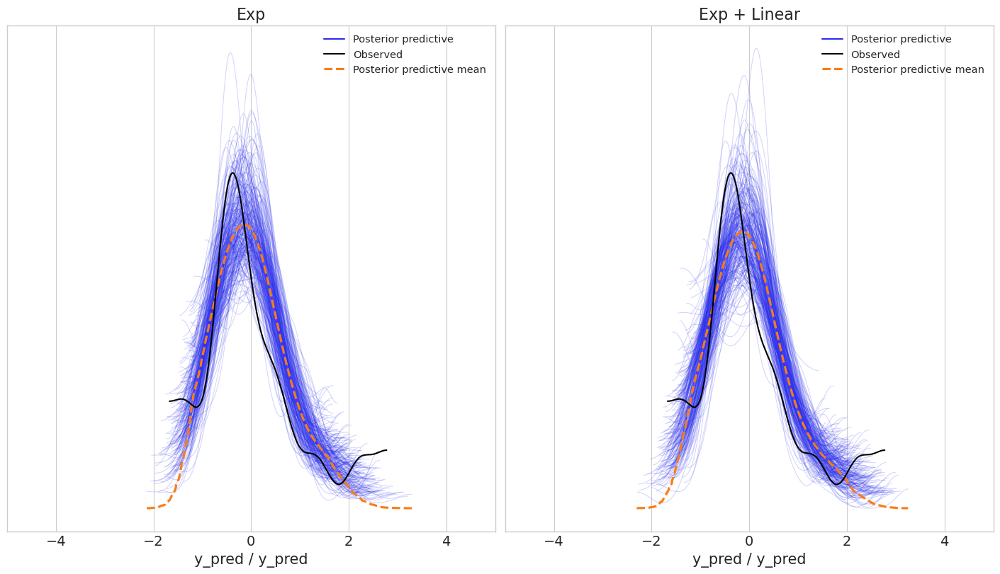

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp')
ax2.set_title('Exp + Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

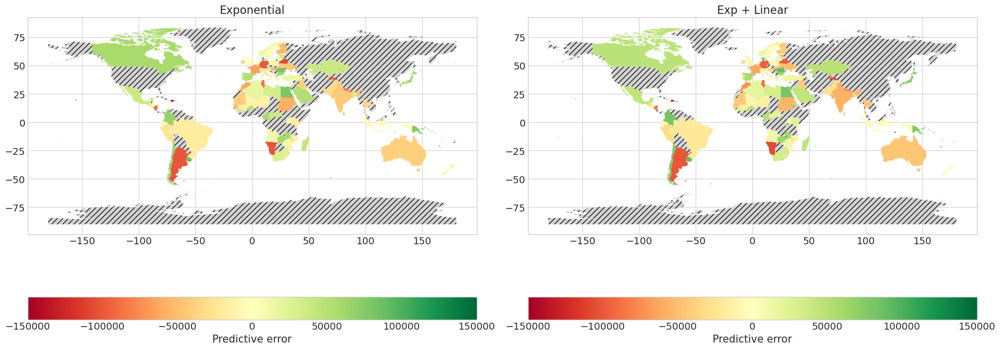

In [26]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Exponential')
ax2.set_title('Exp + Linear')
world_error_plot(world, results['exp']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [23]:
results['exp_linear_sum'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Weighted sum
We can put weights on the kernels to see the importances

In [26]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    w0 = pm.HalfNormal('w0', 5)
    w1 = pm.HalfNormal('w1', 5)
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * w0 + \
        pm.gp.cov.Linear(n_features, c=c) * w1 + \
        pm.gp.cov.WhiteNoise(1e-5) 
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [46]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, w1, w0, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1271 seconds.


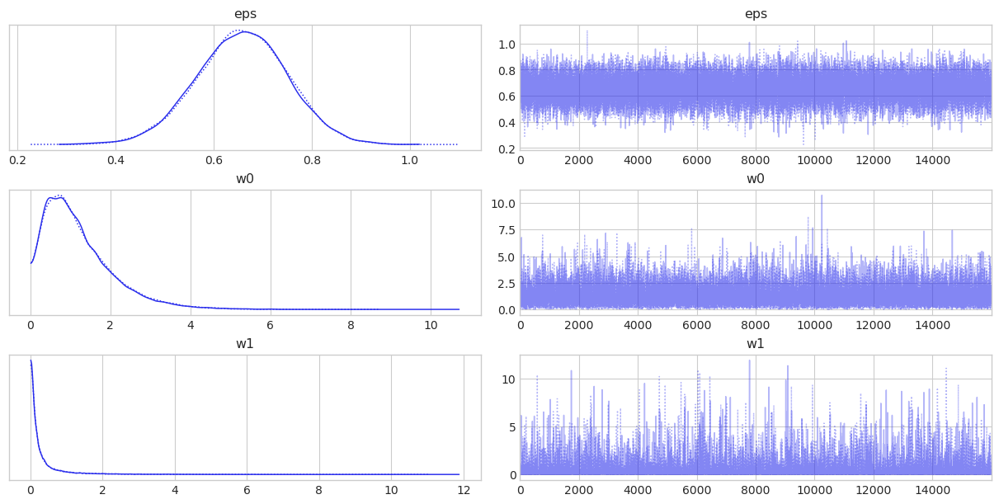

In [47]:
plot_trace(trace, ['eps', 'w0', 'w1'])

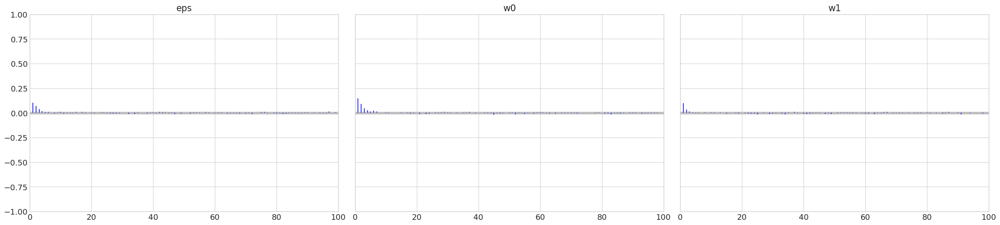

In [48]:
az.plot_autocorr(trace, var_names=['eps', 'w0', 'w1'], combined=True)
plt.show()

In [49]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


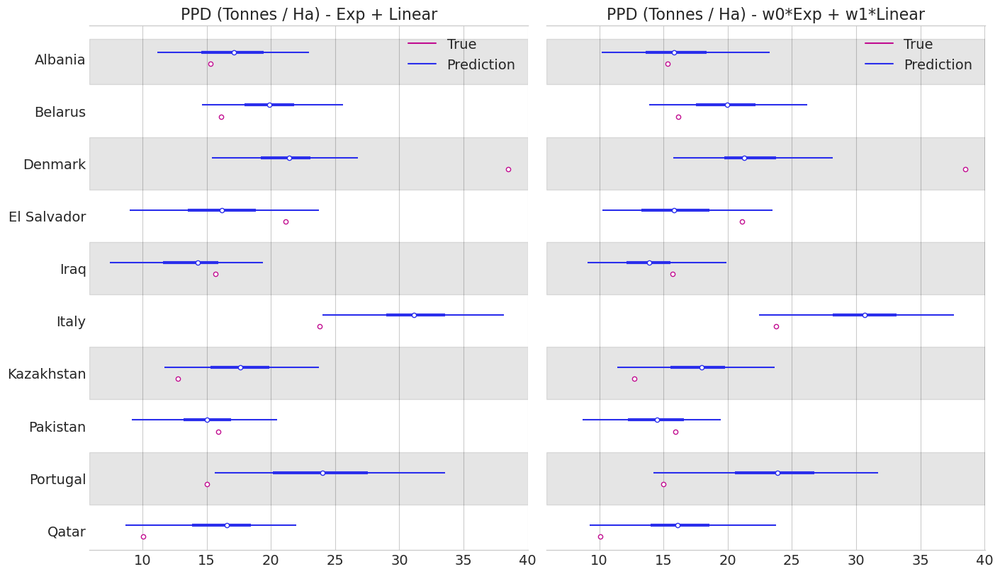

In [54]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_sum']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Exp + Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plt.show()

In [55]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp + Linear      : R2: {} \t MAE: {}".format(results['exp_linear_sum']['r2'], results['exp_linear_sum']['mae']))
print("w0*Exp + w1*Linear: R2: {} \t MAE: {}".format(r2, mae))

Exp + Linear      : R2: 0.7031147883657496 	 MAE: 42191.59230212307
w0*Exp + w1*Linear: R2: 0.67946014213573 	 MAE: 44316.913905290094


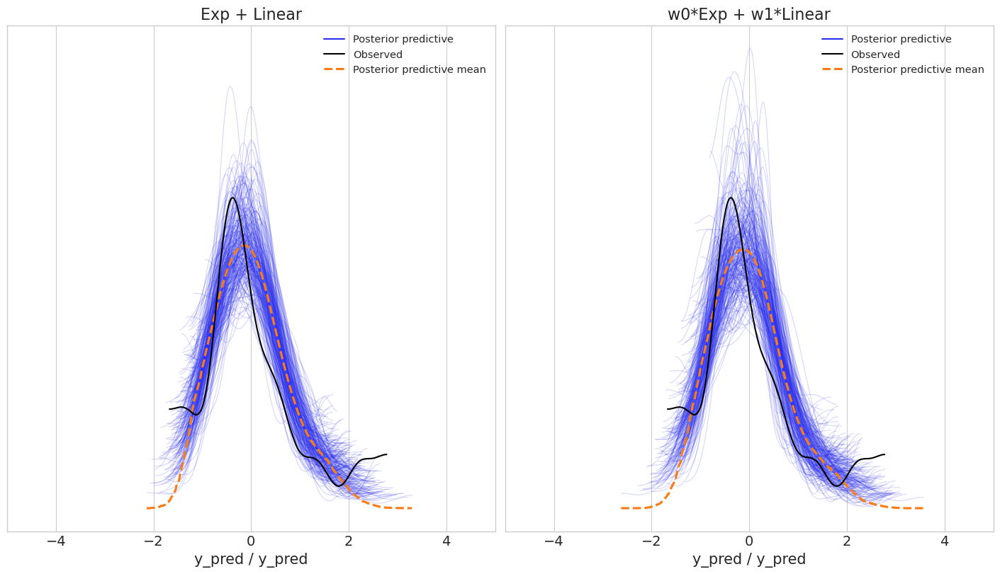

In [27]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp + Linear')
ax2.set_title('w0*Exp + w1*Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

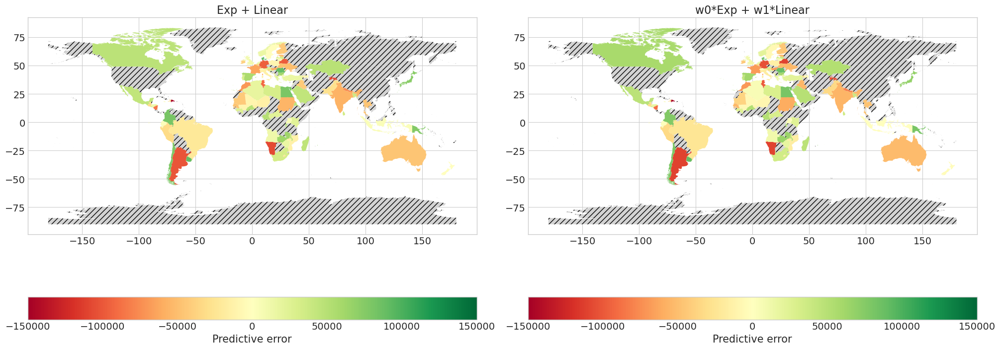

In [56]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Exp + Linear')
ax2.set_title('w0*Exp + w1*Linear')
world_error_plot(world, results['exp_linear_sum']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [57]:
results['exp_linear_weighted'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Multiplying
Multiplying kernels can be interpreted as a logical AND, value is high when both are high 

In [ ]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [ ]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


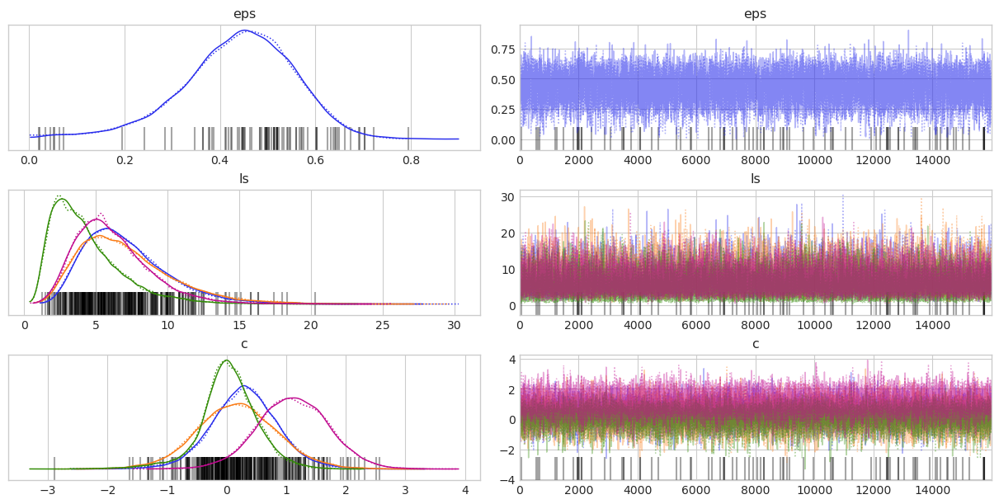

In [11]:
plot_trace(trace, ['eps', 'ls', 'c'])

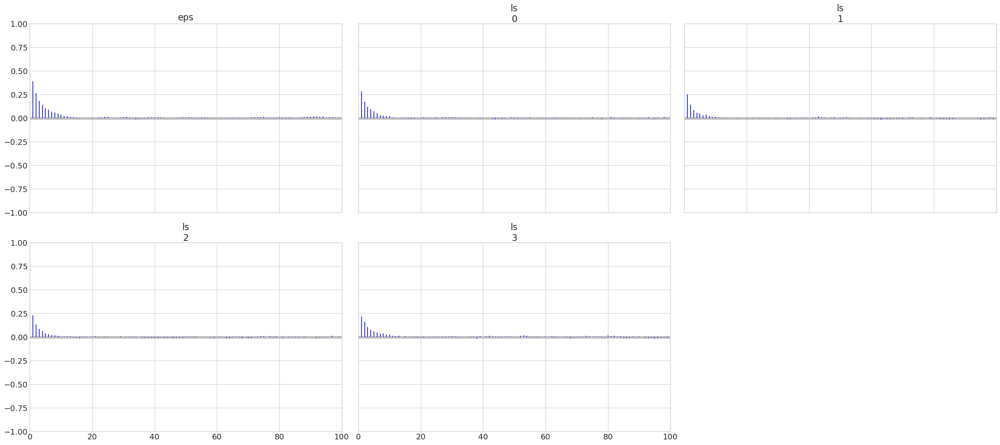

In [12]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [9]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

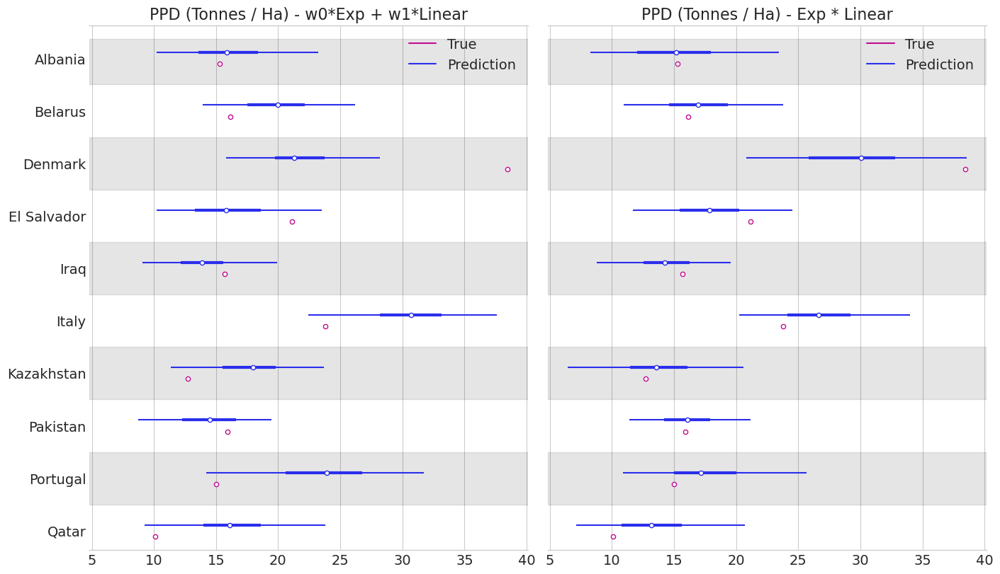

In [13]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_weighted']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - Exp * Linear')
plt.show()

In [ ]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp + Linear      : R2: {} \t MAE: {}".format(results['exp_linear_sum']['r2'], results['exp_linear_sum']['mae']))
print("w0*Exp + w1*Linear: R2: {} \t MAE: {}".format(results['exp_linear_weighted']['r2'], results['exp_linear_weighted']['mae']))
print("Exp * Linear      : R2: {} \t MAE: {}".format(r2, mae))

Exp + Linear      : R2: 0.7031147883657496 	 MAE: 42191.59230212307
w0*Exp + w1*Linear: R2: 0.67946014213573 	 MAE: 44316.913905290094
Exp * Linear      : R2: 0.9358784317384231 	 MAE: 19503.127692891845


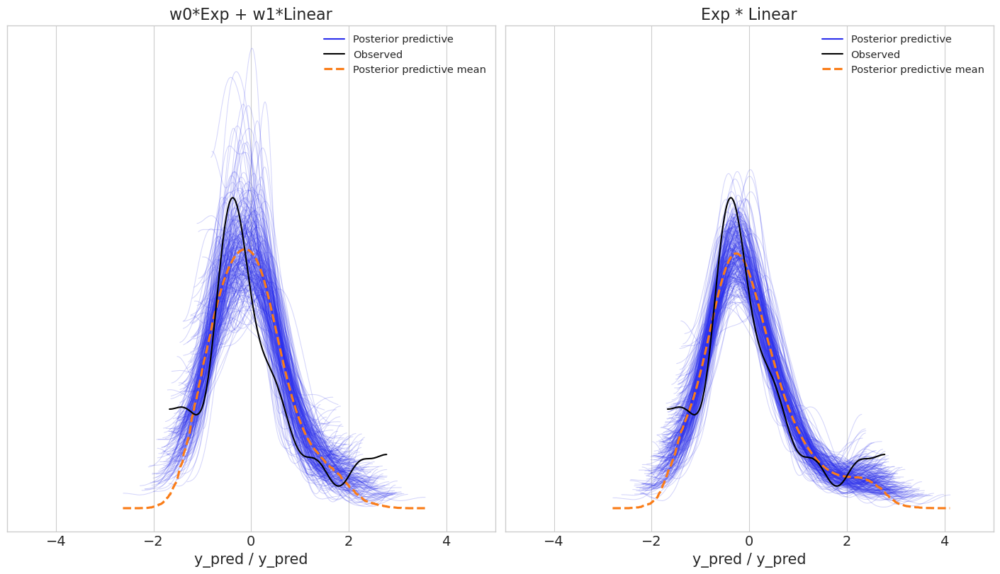

In [29]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('w0*Exp + w1*Linear')
ax2.set_title('Exp * Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_weighted']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

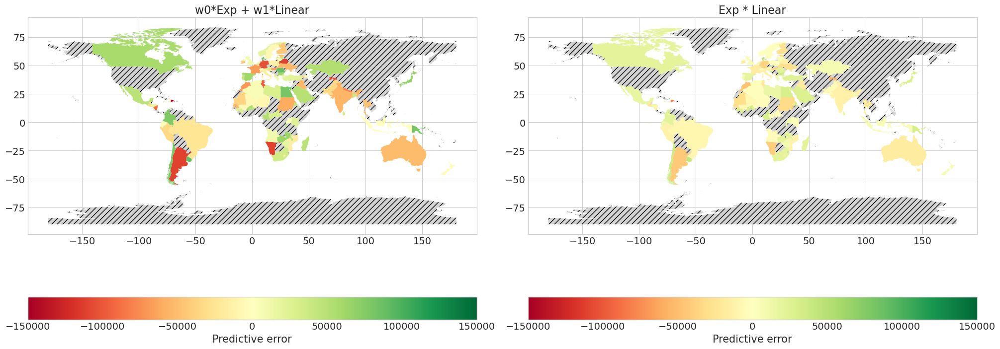

In [16]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('w0*Exp + w1*Linear')
ax2.set_title('Exp * Linear')
world_error_plot(world, results['exp_linear_weighted']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [137]:
results['matern32_linear_mul'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## All features

Let's try now considering all the features

### Realoding dataset without removing features

In [57]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index()

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

            index    hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha  \
count   95.000000      95.000000             95.000000             95.000000   
mean   196.947368  181841.413334           1019.326316            175.288879   
std    113.107402   96668.731420            696.800613            243.238755   
min      1.000000   20516.217391             51.000000              0.120619   
25%    100.500000  127517.738095            577.000000             12.605934   
50%    200.000000  160965.434783            788.000000             82.887988   
75%    291.500000  224914.108696           1492.500000            240.374184   
max    391.000000  448891.538462           3240.000000           1414.555032   

        avg_temp        lat         lon         elev  
count  95.000000  95.000000   95.000000    95.000000  
mean   17.850083  21.398688   15.279380   637.568421  
std     7.388661  27.141268   54.357624   586.573509  
min     3.459565 -41.000000 -102.000000    28.000000  
25% 

((95, 7), (95,), (10, 7), (10,))

### Rebuild the model
Same model as the last one, with *Exponential kernel * Linear*

In [30]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [32]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 793 seconds.
The number of effective samples is smaller than 25% for some parameters.


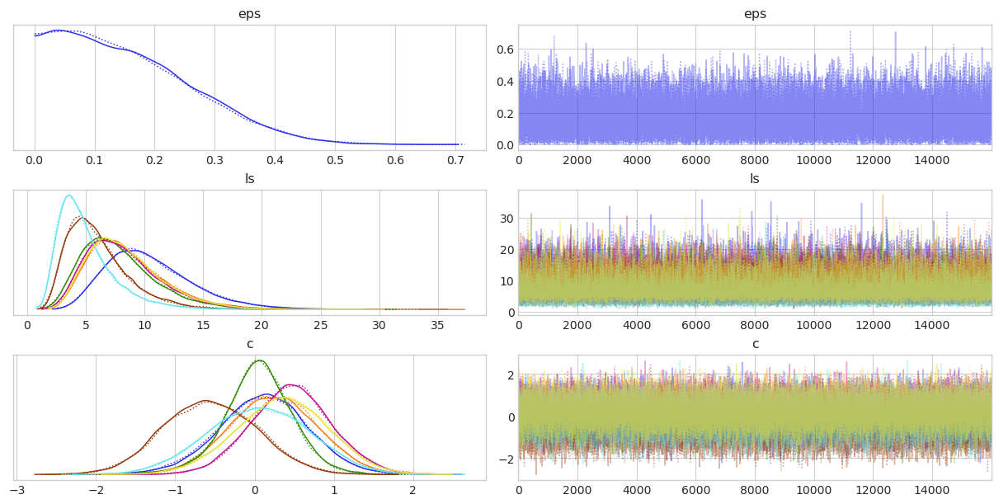

In [32]:
plot_trace(trace, ['eps', 'ls', 'c'])

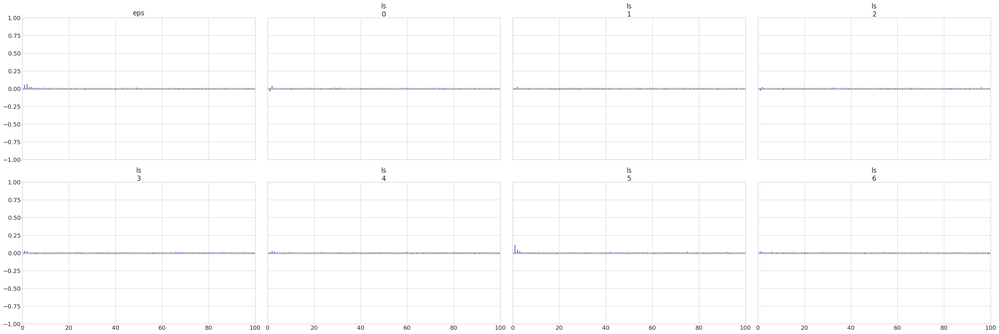

In [33]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [34]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

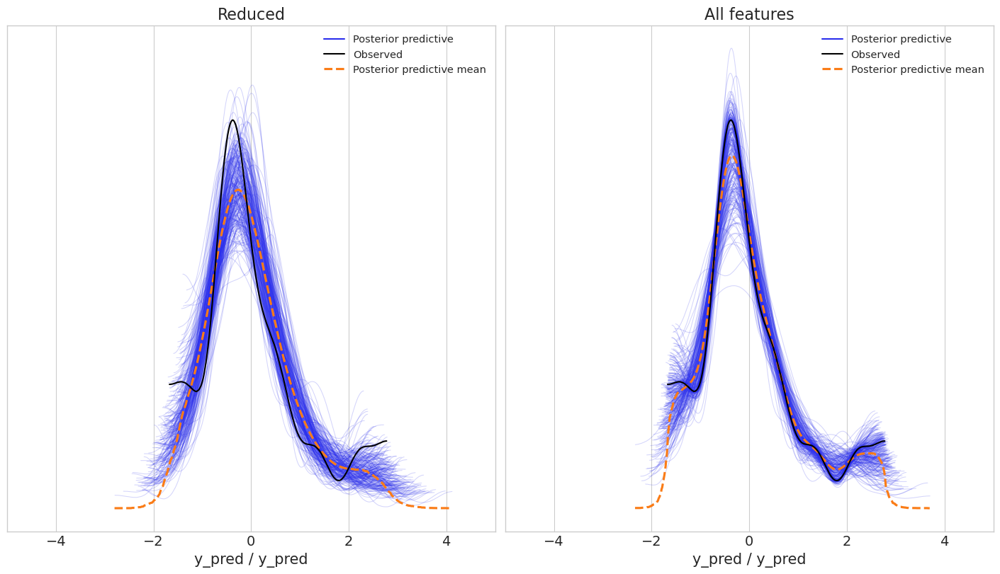

In [43]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Reduced')
ax2.set_title('All features')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_mul']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

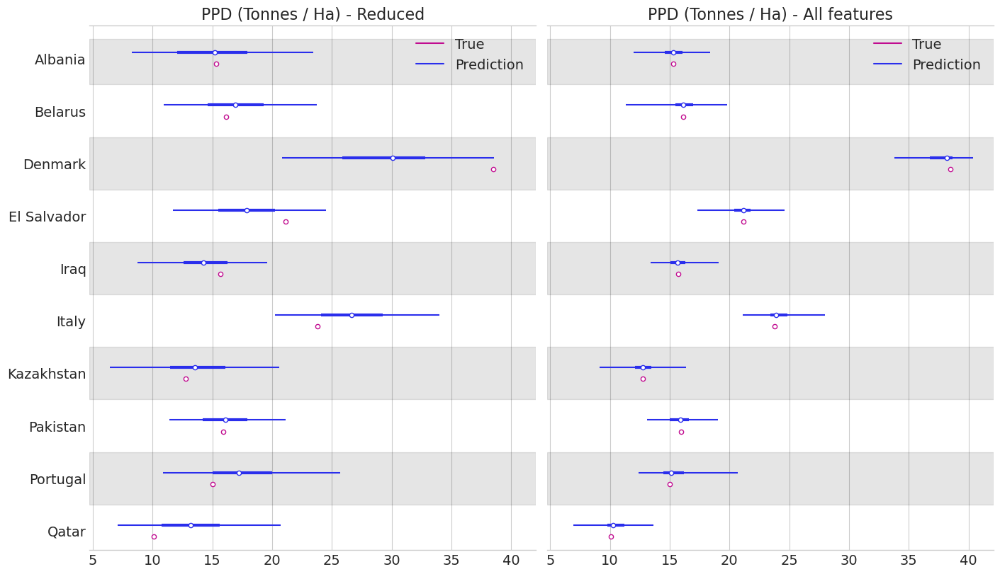

In [42]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_mul']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Reduced')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - All features')
plt.show()

In [37]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Reduced     : R2: {} \t MAE: {}".format(results['exp_linear_weighted']['r2'], results['exp_linear_mul']['mae']))
print("All features: R2: {} \t MAE: {}".format(r2, mae))

Reduced     : R2: 0.67946014213573 	 MAE: 19503.127692891845
All features: R2: 0.9997548728483424 	 MAE: 922.9069341147531


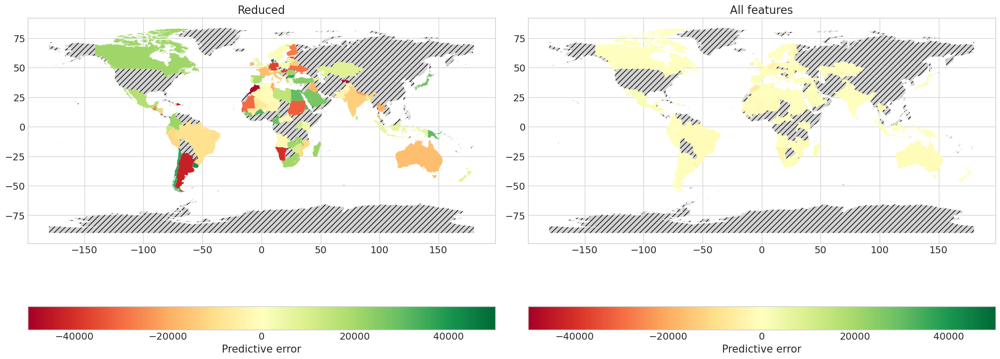

In [44]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Reduced')
ax2.set_title('All features')
world_error_plot(world, results['exp_linear_mul']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=50_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=50_000)
plt.show()

In [37]:
results['all_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More samples

In [60]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [61]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 2809 seconds.


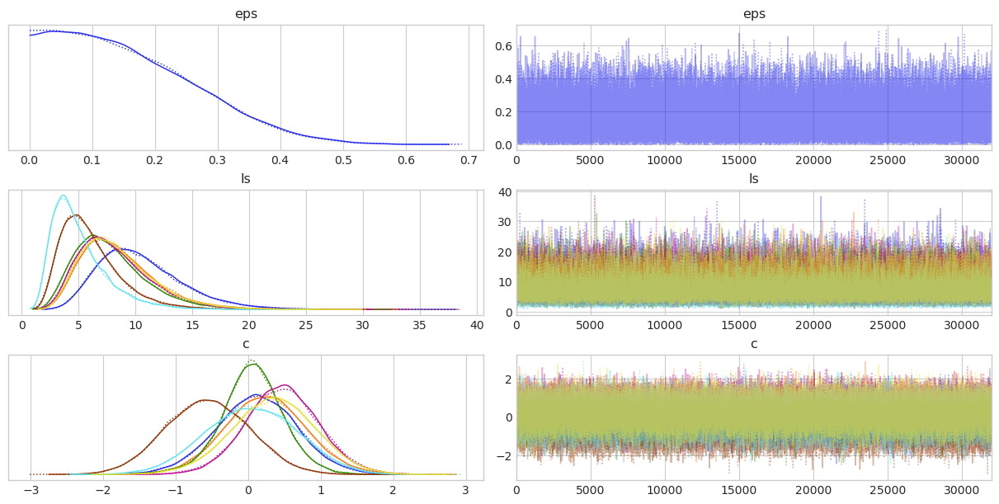

In [62]:
plot_trace(trace, ['eps', 'ls', 'c'])

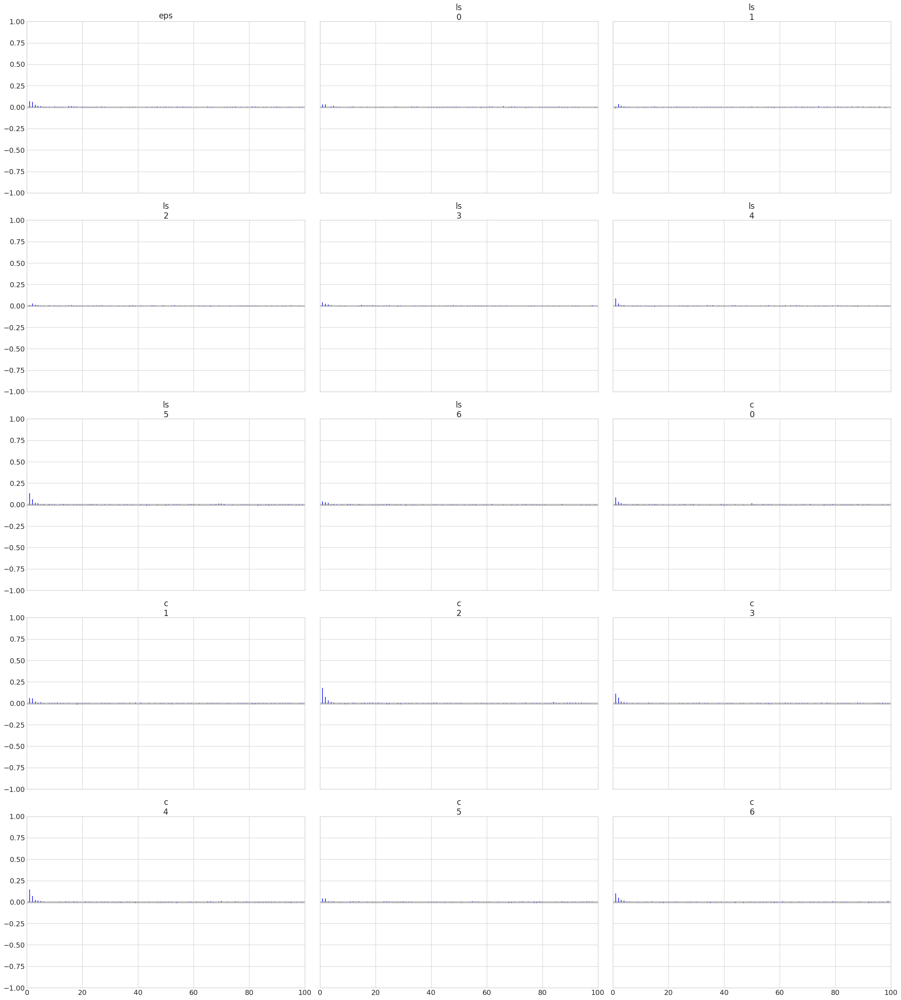

In [63]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [64]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


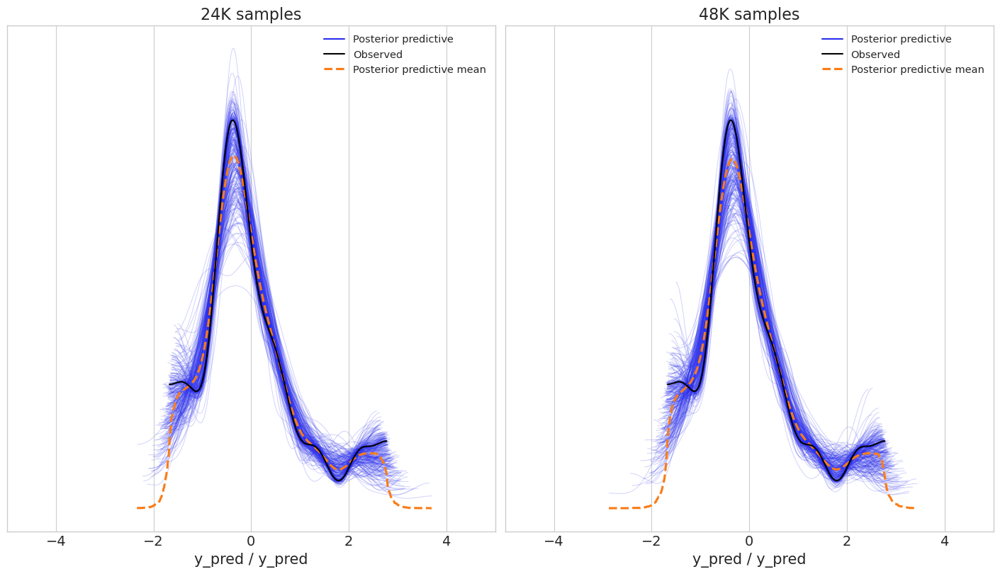

In [65]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('24K samples')
ax2.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [66]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("24K samples: R2: {} \t MAE: {}".format(results['all_exp_linear']['r2'], results['all_exp_linear']['mae']))
print("48K samples: R2: {} \t MAE: {}".format(r2, mae))

24K samples: R2: 0.9997548728483424 	 MAE: 922.9069341147531
48K samples: R2: 0.9996392763911333 	 MAE: 1090.9068734788675


In [67]:
results['all_exp_linear2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Removing Data Outliers (based on Pesticides Skewness)

In [2]:
# Set random seed
np.random.seed(42)

# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)

# Remove countries having pesticides usage lower than the first quartile
q = cy.quantile(0.25)['pesticides_kg_per_ha']
print("Removing samples having Pesticides (Kg/Ha) lower than {:.3f}\n".format(q))
cy = cy[cy['pesticides_kg_per_ha'] > q].reset_index()

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 8
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

Removing samples having Pesticides (Kg/Ha) lower than 12.606

           index    hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha  \
count  71.000000      71.000000             71.000000             71.000000   
mean   47.239437  210000.734832            978.577465            233.284892   
std    28.493841   91728.324464            680.196393            256.792810   
min     0.000000   75126.304348             51.000000             14.222957   
25%    23.500000  144101.136646            577.000000             65.578788   
50%    45.000000  182060.304348            700.000000            160.703514   
75%    72.500000  245124.804348           1449.500000            289.427828   
max    94.000000  448891.538462           3240.000000           1414.555032   

        avg_temp        lat         lon         elev  
count  71.000000  71.000000   71.000000    71.000000  
mean   15.932502  27.360921   11.062785   571.549296  
std     7.165389  27.343970   57.106792   526.034920  
min   

((71, 7), (71,), (8, 7), (8,))

In [3]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [4]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 1801 seconds.


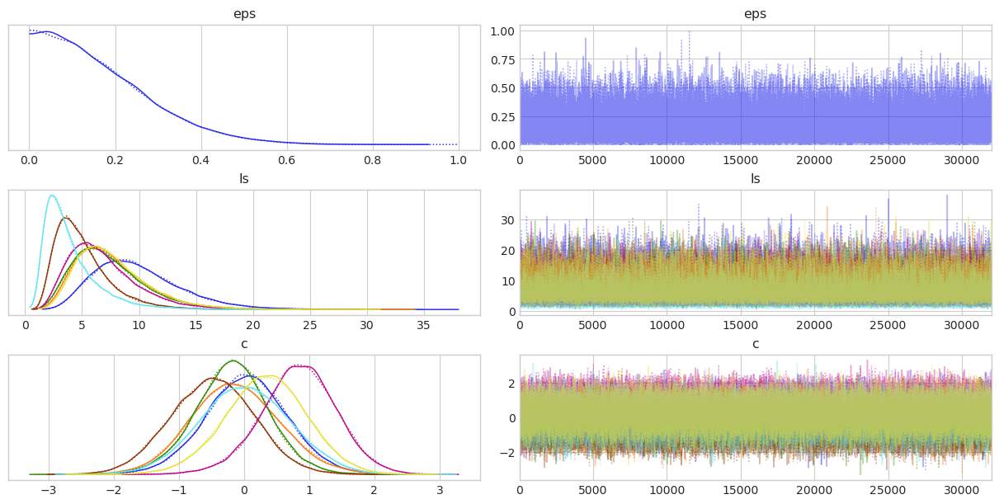

In [5]:
plot_trace(trace, ['eps', 'ls', 'c'])

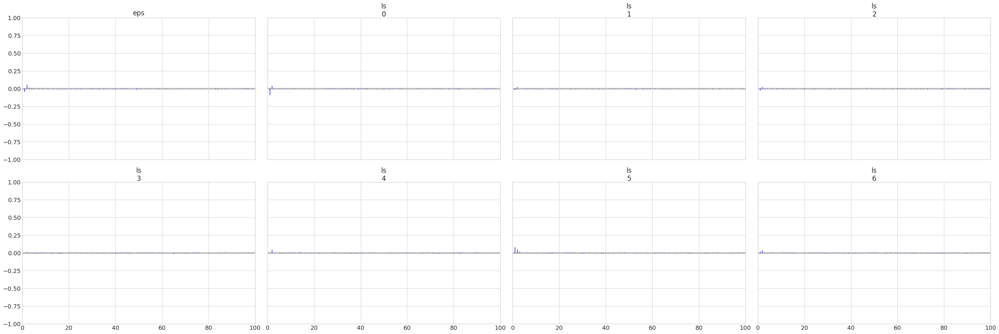

In [6]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [8]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


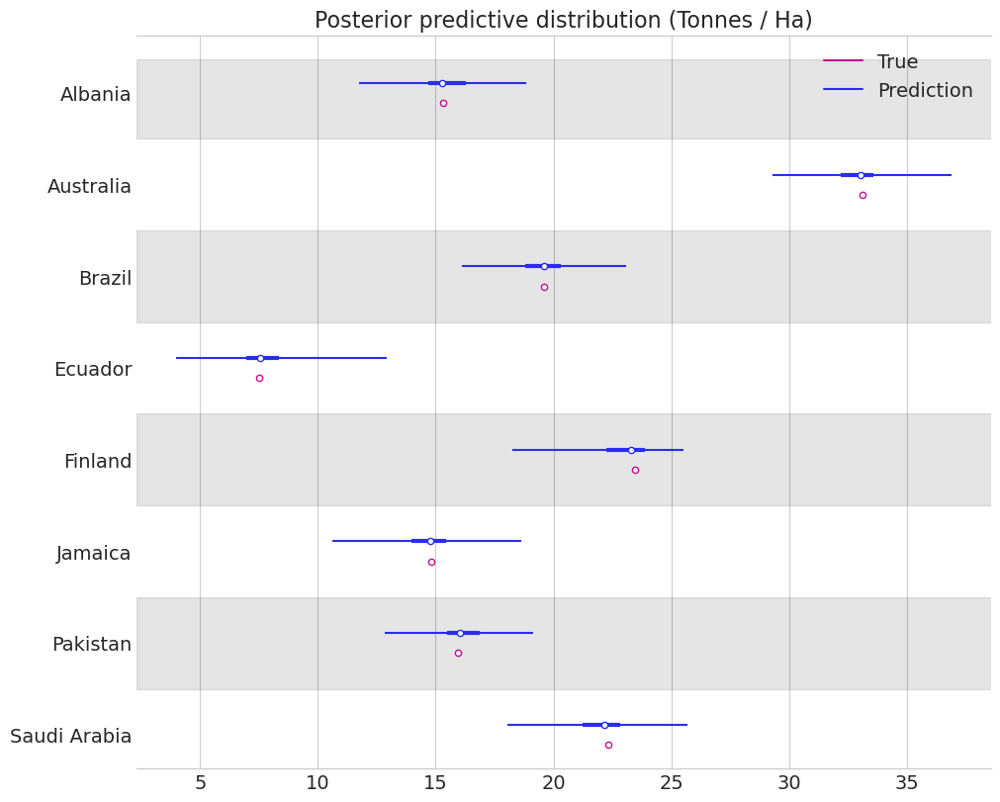

In [9]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

In [10]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.9998146575077806
MAE: 923.7281273529032


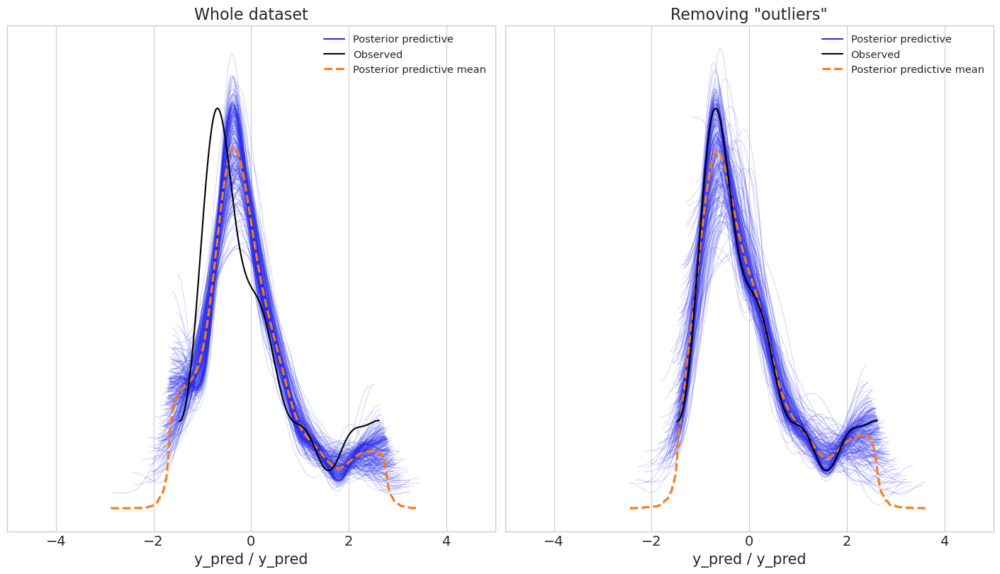

In [14]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Whole dataset')
ax2.set_title('Removing "outliers"')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [15]:
results['out_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Save and load results

In [12]:
# Load results
with open('yp_potato.pickle', 'rb') as handle:
    results = pickle.load(handle)

In [17]:
# Save results
with open('yp_potato.pickle', 'wb') as handle:
    pickle.dump(results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [80]:
rs = results['matern32']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']

In [16]:
results.keys()

dict_keys(['expquad1', 'expquad2', 'expquad3', 'poly', 'rat', 'matern32', 'exp', 'matern32_linear', 'all_expquad2', 'all_expquad', 'out_expquad', 'out_expquad2', 'out_expquad3', 'expquad4', 'matern32_linear_mul', 'matern32_linear_weighted', 'exp_linear_sum', 'exp_linear_weighted', 'exp_linear_mul', 'all_exp_linear', 'all_exp_linear2', 'out_exp_linear'])

In [ ]:
rs = results['all_exp_linear2']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']